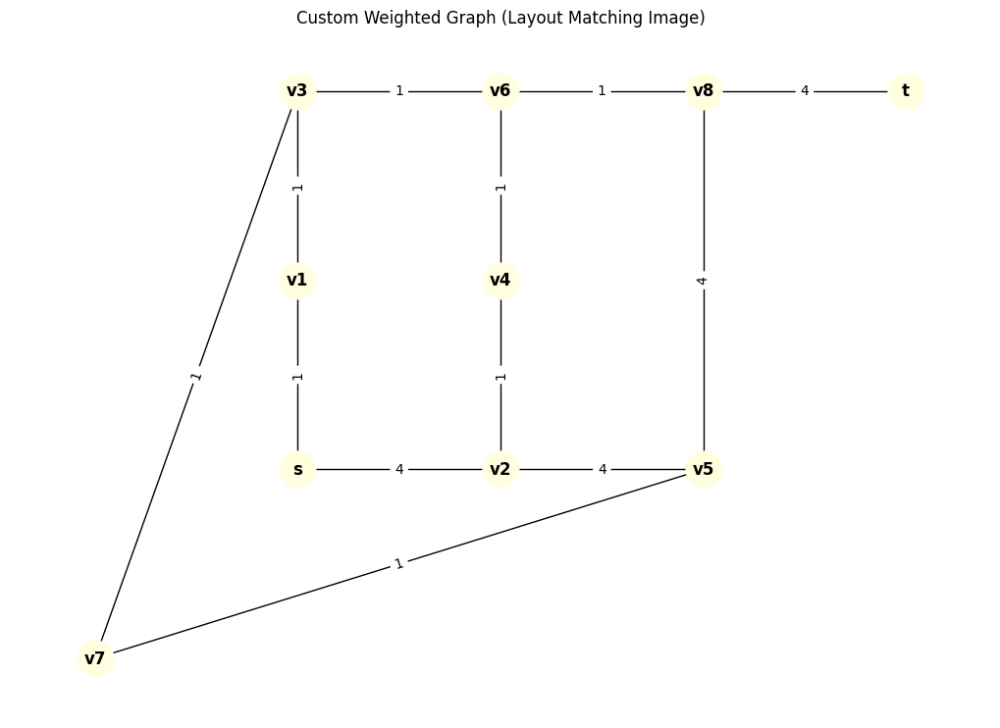

In [16]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import time

def create_custom_weighted_graph():
    """
    Creates the undirected weighted graph as shown in the provided image.
    Node labels: s, v1, v2, v3, v4, v5, v6, v7, v8, t
    Edge weights are as in black in the image.
    """
    G = nx.Graph()
    nodes = ['s', 'v1', 'v2', 'v3', 'v4', 'v5', 'v6', 'v7', 'v8', 't']
    G.add_nodes_from(nodes)
    edges = [
        ('s', 'v1', 1),
        ('s', 'v2', 4),
        ('v1', 'v3', 1),
        ('v2', 'v4', 1),
        ('v2', 'v5', 4),
        ('v3', 'v6', 1),
        ('v3', 'v7', 1),
        ('v4', 'v6', 1),
        ('v5', 'v8', 4),
        ('v6', 'v8', 1),
        ('v5', 'v7', 1),
        ('v8', 't', 4)
    ]
    for u, v, w in edges:
        G.add_edge(u, v, weight=w)
    return G

G = create_custom_weighted_graph()

# Positions chosen to match the image as closely as possible
pos = {
    's':   (0, 0),
    'v1':  (0, 1),
    'v2':  (1, 0),
    'v3':  (0, 2),
    'v4':  (1, 1),
    'v5':  (2, 0),
    'v6':  (1, 2),
    'v7':  (-1, -1),
    'v8':  (2, 2),
    't':   (3, 2)
}

plt.figure(figsize=(10, 7))
nx.draw(G, pos, with_labels=True, node_color='lightyellow', node_size=700, font_weight='bold')
edge_labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_color='black')
plt.title("Custom Weighted Graph (Layout Matching Image)")
plt.axis('off')
plt.show()

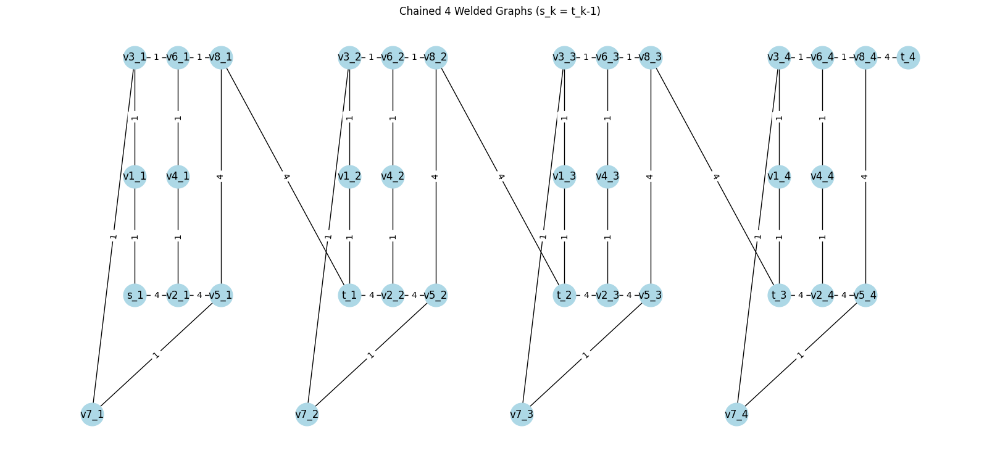

In [17]:
def chain_n_welded_graphs(G_base, n):
    """
    Chains n copies of G_base by identifying s_k with t_{k-1} for k > 1.
    Returns the chained graph and a position dictionary for plotting.
    """
    import networkx as nx

    G_total = nx.Graph()
    pos_total = {}
    x_offset = 0
    x_step = 5  # horizontal spacing between blocks

    prev_t_name = None

    for k in range(1, n+1):
        # Relabel nodes for this block
        mapping = {node: f"{node}_{k}" for node in G_base.nodes}
        Gk = nx.relabel_nodes(G_base, mapping)
        # Position offset for this block
        pos_k = {f"{node}_{k}": (x + x_offset, y) for node, (x, y) in pos.items()}

        # If not the first block, merge s_k with t_{k-1}
        if k > 1:
            s_k = f"s_{k}"
            t_prev = f"t_{k-1}"
            # Merge s_k into t_{k-1}
            Gk = nx.relabel_nodes(Gk, {s_k: t_prev})
            if s_k in pos_k:
                pos_k[t_prev] = pos_k.pop(s_k)

        G_total.add_nodes_from(Gk.nodes(data=True))
        G_total.add_edges_from(Gk.edges(data=True))
        pos_total.update(pos_k)
        x_offset += x_step

    return G_total, pos_total

# Example usage:
n = 4# Number of blocks
G_chain, pos_chain = chain_n_welded_graphs(G, n)

plt.figure(figsize=(16, 7))
nx.draw(G_chain, pos_chain, with_labels=True, node_color='lightblue', node_size=700)
edge_labels = nx.get_edge_attributes(G_chain, 'weight')
nx.draw_networkx_edge_labels(G_chain, pos_chain, edge_labels=edge_labels, font_color='black')
plt.title(f"Chained {n} Welded Graphs (s_k = t_k-1)")
plt.axis('off')
plt.show()

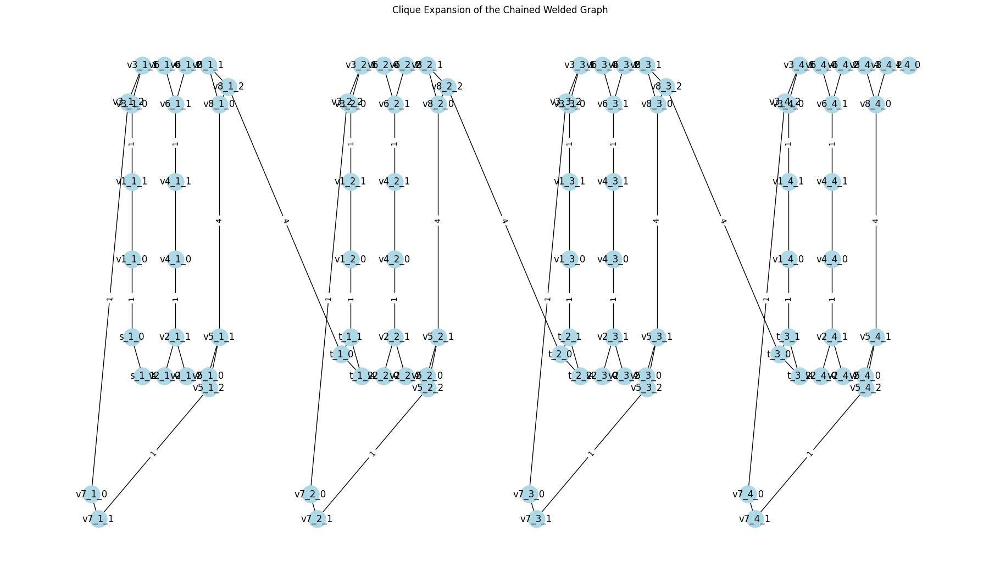

In [18]:
def clique_expansion_all_nodes(G, pos):
    """
    For every vertex v in G, create a clique of size deg(v).
    Each neighbor of v is represented by a unique node in the clique, placed in the direction of the neighbor.
    For each edge (u, v) in G, connect the corresponding nodes in the cliques of u and v.
    Returns: H (expanded graph), mapping (dict: original node -> list of new nodes), pos_H (positions for H)
    """
    import numpy as np

    H = nx.Graph()
    mapping = {}  # original node -> list of new nodes
    pos_H = {}    # positions for the expanded graph

    for v in G.nodes():
        neighbors = list(G.neighbors(v))
        k = len(neighbors)
        if k == 0:
            # Isolated node, just copy
            mapping[v] = [v]
            H.add_node(v)
            pos_H[v] = pos[v]
            continue
        mapping[v] = []
        for i, nbr in enumerate(neighbors):
            new_node = f"{v}_{i}"
            mapping[v].append(new_node)
            # Place the node in the direction of the neighbor, but close to v
            vx, vy = pos[v]
            nx_, ny_ = pos[nbr]
            direction = np.array([nx_ - vx, ny_ - vy])
            if np.linalg.norm(direction) == 0:
                direction = np.array([0.1, 0])  # fallback
            direction = direction / np.linalg.norm(direction)
            offset = 0.25  # distance from v
            px, py = vx + offset * direction[0], vy + offset * direction[1]
            pos_H[new_node] = (px, py)
            H.add_node(new_node)
        # Connect all clique nodes for v
        for i in range(k):
            for j in range(i+1, k):
                H.add_edge(mapping[v][i], mapping[v][j])

    # For each edge, connect the corresponding nodes in the cliques
    edge_count = {v: 0 for v in G.nodes()}
    for u, v in G.edges():
        weight = G[u][v].get('weight', 1)
        u_node = mapping[u][edge_count[u]]
        edge_count[u] += 1
        v_node = mapping[v][edge_count[v]]
        edge_count[v] += 1
        H.add_edge(u_node, v_node, weight=weight)

    return H, mapping, pos_H

# Apply to the chained welded graph from cell 2
H_chain, mapping_chain, pos_H_chain = clique_expansion_all_nodes(G_chain, pos_chain)

plt.figure(figsize=(18, 10))
nx.draw(H_chain, pos_H_chain, with_labels=True, node_color='lightblue', node_size=500)
edge_labels = nx.get_edge_attributes(H_chain, 'weight')
nx.draw_networkx_edge_labels(H_chain, pos_H_chain, edge_labels=edge_labels, font_color='black')
plt.title("Clique Expansion of the Chained Welded Graph")
plt.axis('off')
plt.show()

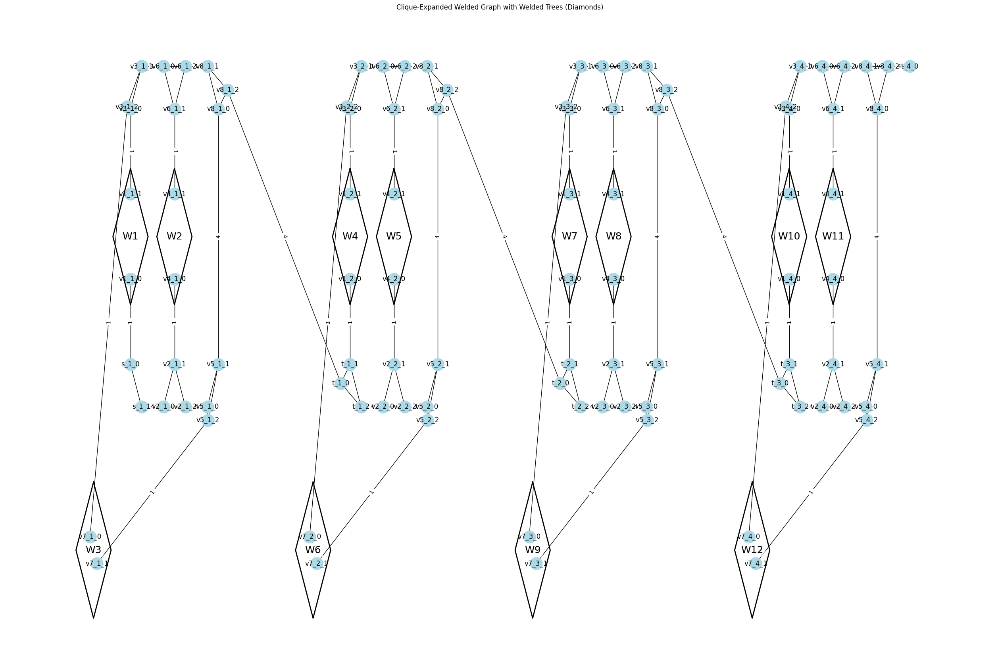

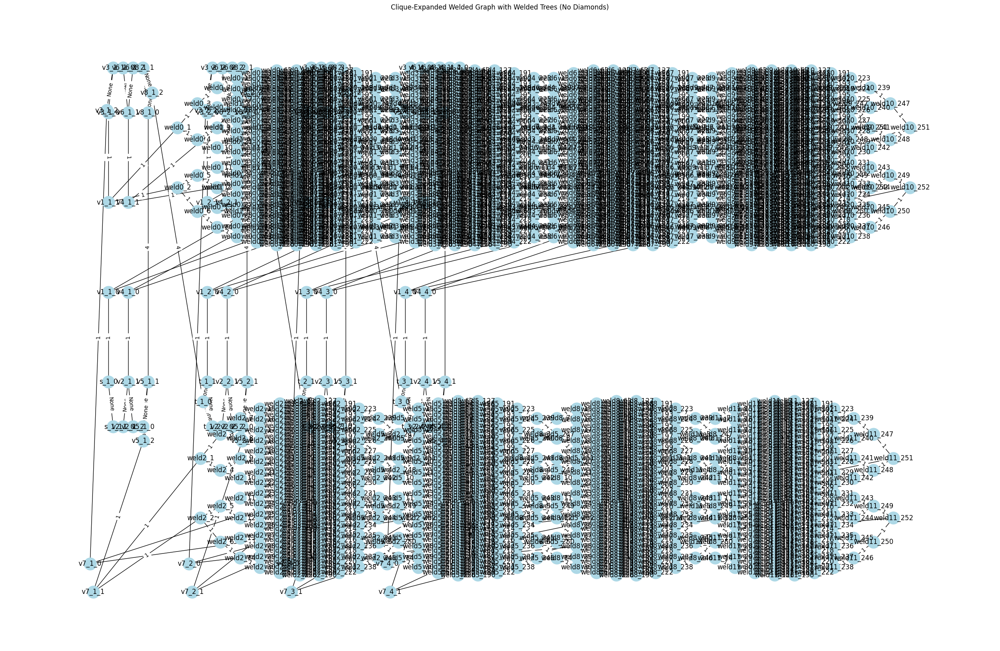

Sample welded tree edges and weights:
v1_1_1 -- weld0_1 : weight = 1
v1_1_1 -- weld0_2 : weight = 1
weld0_1 -- weld0_3 : weight = 1
weld0_1 -- weld0_4 : weight = 1
weld0_2 -- weld0_5 : weight = 1
weld0_2 -- weld0_6 : weight = 1
weld0_3 -- weld0_7 : weight = 1
weld0_3 -- weld0_8 : weight = 1
weld0_4 -- weld0_9 : weight = 1
weld0_4 -- weld0_10 : weight = 1


In [19]:
def layered_welded_tree(depth, seed=int(time.time())):
    import networkx as nx
    G = nx.Graph()
    layers = {}
    node = 0
    layers[0] = [node]
    node += 1
    for d in range(1, depth+1):
        layers[d] = []
        for parent in layers[d-1]:
            left = node
            right = node + 1
            G.add_edge(int(parent), int(left), weight=1)
            G.add_edge(int(parent), int(right), weight=1)
            layers[d].extend([int(left), int(right)])
            node += 2
    left_leaves = layers[depth]
    mid_layer = []
    for i in range(2**depth):
        mid_layer.append(node)
        node += 1
    layers[depth+1] = [int(x) for x in mid_layer]
    import numpy as np
    np.random.seed(seed)
    perm = np.random.permutation(mid_layer)
    for i, l in enumerate(left_leaves):
        m1 = int(perm[i % len(mid_layer)])
        m2 = int(perm[(i+1) % len(mid_layer)])
        G.add_edge(int(l), m1, weight=1)
        G.add_edge(int(l), m2, weight=1)
    right_layers = {}
    right_layers[depth+1] = [int(x) for x in mid_layer]
    curr_layer = [int(x) for x in mid_layer]
    for d in range(depth):
        next_layer = []
        for i in range(0, len(curr_layer), 2):
            parent = node
            G.add_edge(int(curr_layer[i]), int(parent), weight=1)
            G.add_edge(int(curr_layer[i+1]), int(parent), weight=1)
            next_layer.append(int(parent))
            node += 1
        right_layers[depth+2+d] = next_layer
        curr_layer = next_layer
    exit_node = int(curr_layer[0])
    all_layers = []
    for d in range(depth+1):
        all_layers.append(layers[d])
    all_layers.append(layers[depth+1])
    for d in range(depth+2, depth+2+depth):
        all_layers.append(right_layers[d])
    pos = {}
    for i, layer in enumerate(all_layers):
        y_step = 1.0 / (len(layer) + 1)
        for j, n in enumerate(layer):
            pos[int(n)] = (i, 1 - (j+1)*y_step)
    entrance = int(layers[0][0])
    G = nx.relabel_nodes(G, lambda x: int(x))
    return G, pos, entrance, exit_node
def substitute_edges_with_welded_trees(H, pos_H, pairs, depth):
    import time
    import networkx as nx

    for idx, (vj_0, vj_1) in enumerate(pairs):
        if H.has_edge(vj_0, vj_1):
            H.remove_edge(vj_0, vj_1)
        seed = int(time.time()) + idx
        G_weld, pos_weld, entrance, exit_node = layered_welded_tree(depth, seed=seed)
        mapping = {old: f"weld{idx}_{old}" for old in G_weld.nodes}
        G_weld = nx.relabel_nodes(G_weld, mapping)
        pos_weld = {
            mapping[k]: (
                (pos_H[vj_1][0] + pos_H[vj_0][0]) / 2 + 2.5 + idx + v[0],
                (pos_H[vj_1][1] + pos_H[vj_0][1]) / 2 + v[1]
            )
            for k, v in pos_weld.items()
        }
        entrance_new = mapping[entrance]
        exit_new = mapping[exit_node]

        # Save neighbors and edge data before removing nodes
        neighbors_0 = list(H.neighbors(vj_0)) if vj_0 in H else []
        neighbors_1 = list(H.neighbors(vj_1)) if vj_1 in H else []
        edges_0 = [(n, H[vj_0][n]) for n in neighbors_0 if n != vj_1] if vj_0 in H else []
        edges_1 = [(n, H[vj_1][n]) for n in neighbors_1 if n != vj_0] if vj_1 in H else []

        # Remove vj_0 and vj_1 from H after saving their neighbors
        if vj_0 in H:
            H.remove_node(vj_0)
        if vj_1 in H:
            H.remove_node(vj_1)

        # Relabel entrance_new to vj_1 and exit_new to vj_0 in G_weld
        relabel_map = {entrance_new: vj_1, exit_new: vj_0}
        G_weld = nx.relabel_nodes(G_weld, relabel_map)
        # Update positions
        pos_weld[vj_1] = pos_H[vj_1]
        pos_weld[vj_0] = pos_H[vj_0]
        pos_weld.pop(entrance_new, None)
        pos_weld.pop(exit_new, None)

        # Remove any self-loops that may have been created by relabeling
        if G_weld.has_edge(vj_1, vj_1):
            G_weld.remove_edge(vj_1, vj_1)
        if G_weld.has_edge(vj_0, vj_0):
            G_weld.remove_edge(vj_0, vj_0)

        # Add all nodes and edges of the welded tree to H
        H.add_nodes_from(G_weld.nodes(data=True))
        H.add_edges_from(G_weld.edges(data=True))
        pos_H.update(pos_weld)

        # Reconnect the old neighbors to the new merged nodes
        for n, d in edges_0:
            H.add_edge(vj_0, n, **d)
        for n, d in edges_1:
            H.add_edge(vj_1, n, **d)
    return H, pos_H

# --- Find all pairs for all i in the welded graph ---
pairs = []
n_blocks = n  # Use the same n as in chain_n_welded_graphs
for i in range(1, n_blocks+1):
    pairs.append((f'v1_{i}_0', f'v1_{i}_1'))
    pairs.append((f'v4_{i}_0', f'v4_{i}_1'))
    pairs.append((f'v7_{i}_0', f'v7_{i}_1'))

depth = 6
H_chain_welded, pos_H_chain_welded = substitute_edges_with_welded_trees(H_chain, pos_H_chain, pairs, depth)

# --- Visualization with diamonds for welded trees ---
welded_nodes_internal = [n for n in H_chain_welded.nodes if "weld" in str(n)]

H_main = H_chain_welded.copy()
H_main.remove_nodes_from(welded_nodes_internal)

plt.figure(figsize=(25, 16))
nx.draw(H_main, pos_H_chain_welded, with_labels=True, node_color='lightblue', node_size=500)
edge_labels = nx.get_edge_attributes(H_main, 'weight')
nx.draw_networkx_edge_labels(H_main, pos_H_chain_welded, edge_labels=edge_labels, font_color='black')

for idx, (vj_0, vj_1) in enumerate(pairs):
    x0, y0 = pos_H_chain_welded[vj_1]
    x1, y1 = pos_H_chain_welded[vj_0]
    center_x = (x0 + x1) / 2
    center_y = (y0 + y1) / 2
    size = 0.4
    diamond = [
        (center_x, center_y + size),
        (center_x + size, center_y),
        (center_x, center_y - size),
        (center_x - size, center_y),
        (center_x, center_y + size)
    ]
    xs, ys = zip(*diamond)
    plt.plot(xs, ys, color='black', linewidth=2)
    plt.text(center_x, center_y, f"W{idx+1}", fontsize=18, ha='center', va='center', color='black',
             bbox=dict(facecolor='white', edgecolor='none', alpha=0.7, boxstyle='round,pad=0.2'))

plt.title("Clique-Expanded Welded Graph with Welded Trees (Diamonds)")
plt.axis('off')
plt.show()

# --- Visualization without diamonds ---
plt.figure(figsize=(25, 16))
nx.draw(H_chain_welded, pos_H_chain_welded, with_labels=True, node_color='lightblue', node_size=500)
# Force edge_labels to always show weights, even for welded tree edges
edge_labels = {(u, v): d.get('weight', None) for u, v, d in H_chain_welded.edges(data=True)}
nx.draw_networkx_edge_labels(H_chain_welded, pos_H_chain_welded, edge_labels=edge_labels, font_color='black')
plt.title("Clique-Expanded Welded Graph with Welded Trees (No Diamonds)")
plt.axis('off')
plt.show()

# --- Print a few welded tree edges and their weights for verification ---
print("Sample welded tree edges and weights:")
count = 0
for n1, n2, d in H_chain_welded.edges(data=True):
    if "weld" in str(n1) or "weld" in str(n2):
        print(f"{n1} -- {n2} : weight = {d.get('weight', None)}")
        count += 1
        if count >= 10:
            break

Green tessellation: no node overlaps (matching OK).
Green tessellation: no duplicate edges.


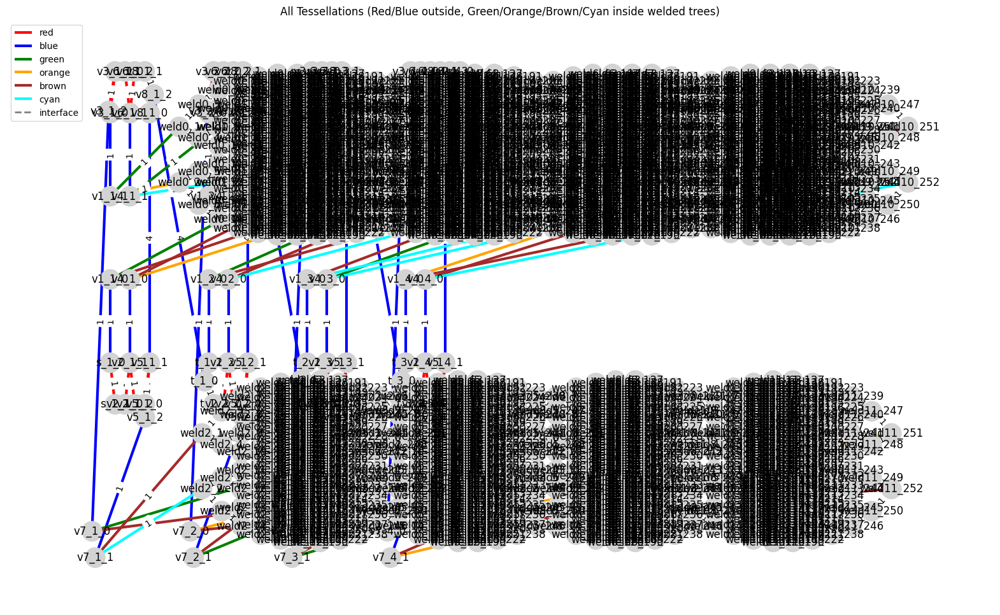

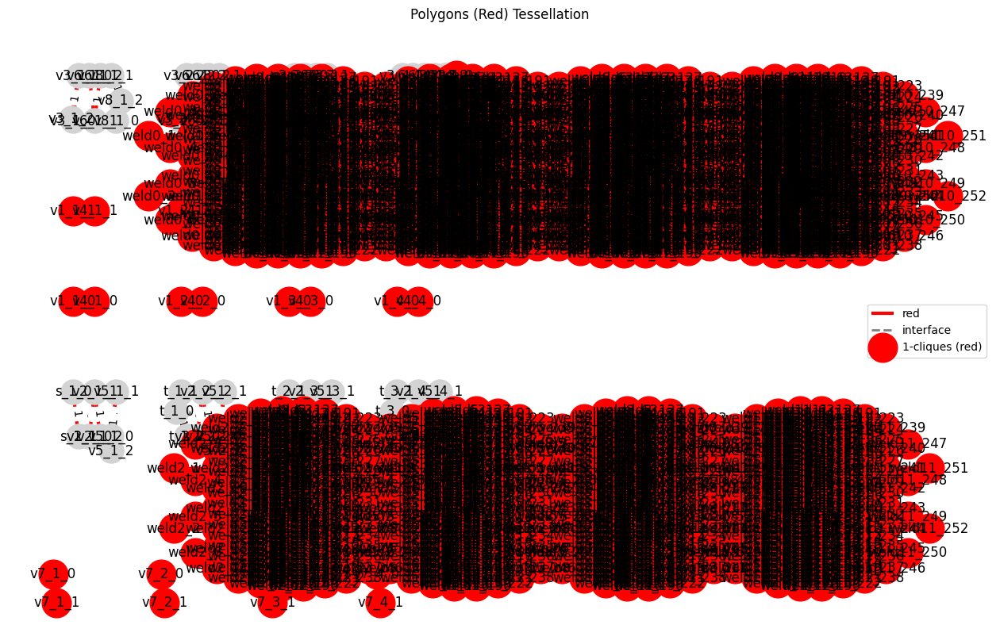

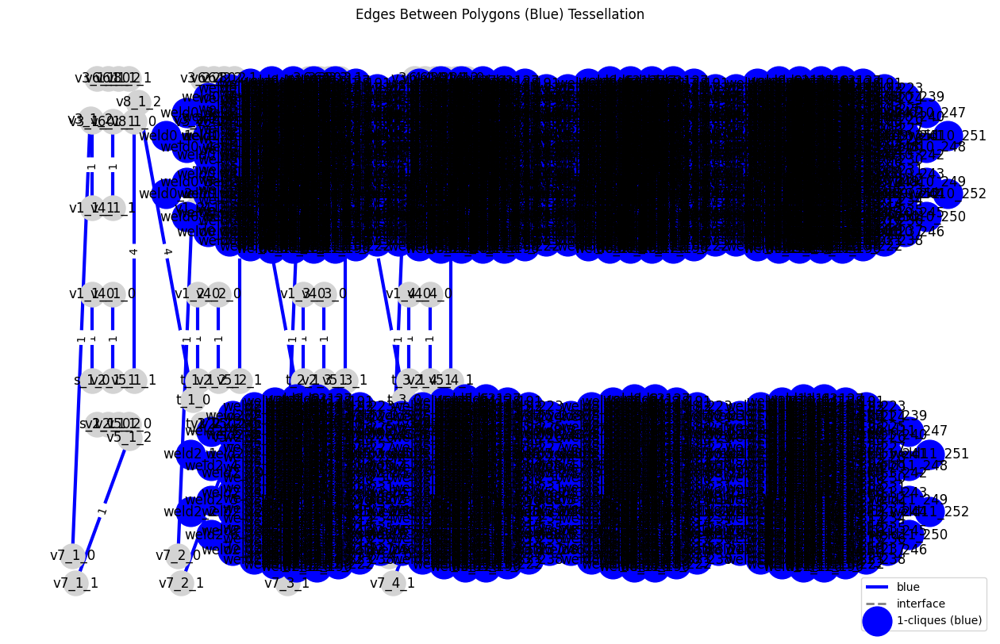

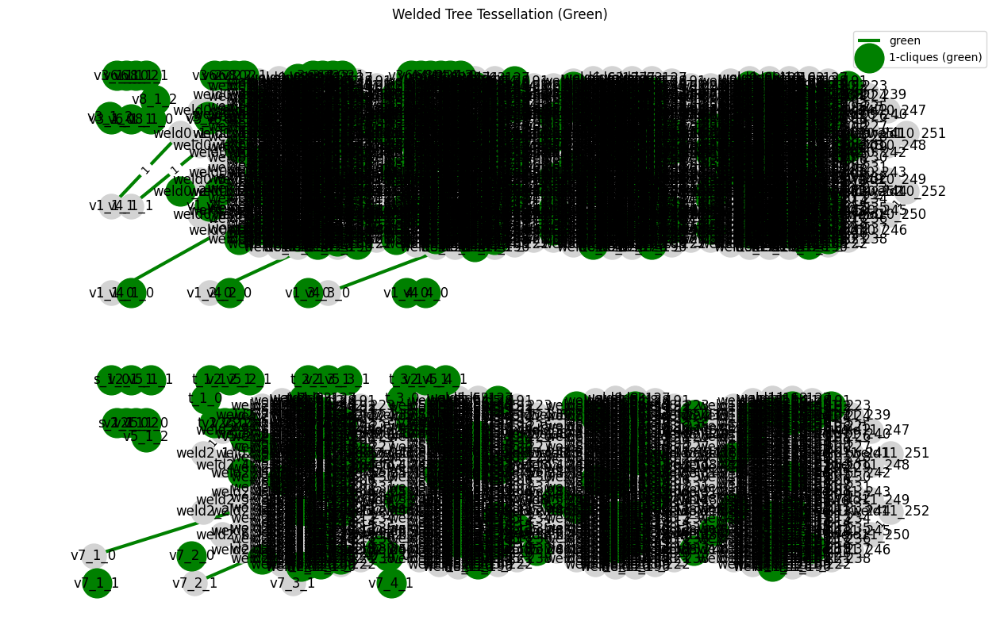

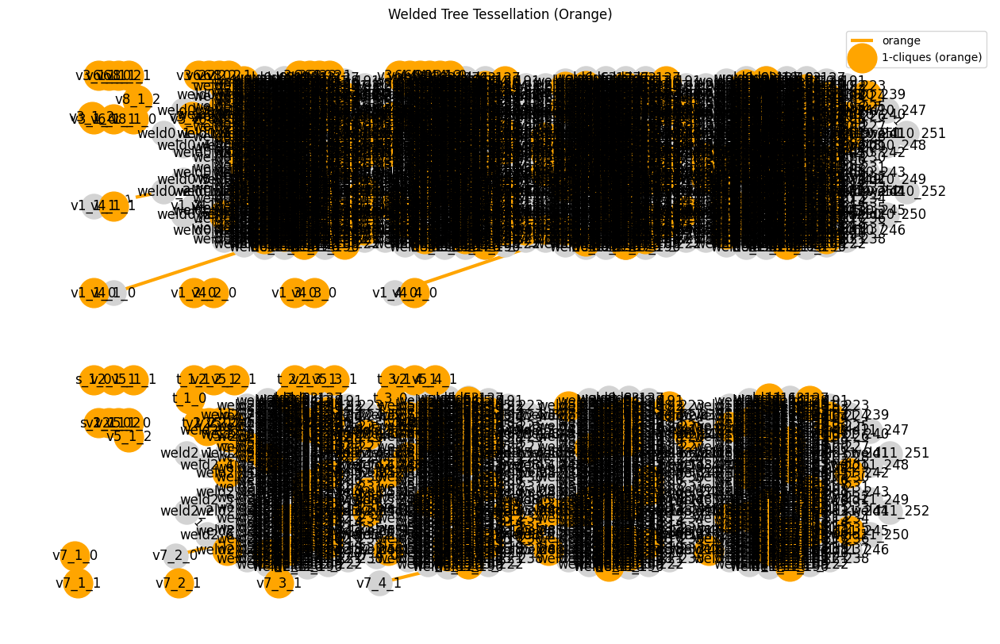

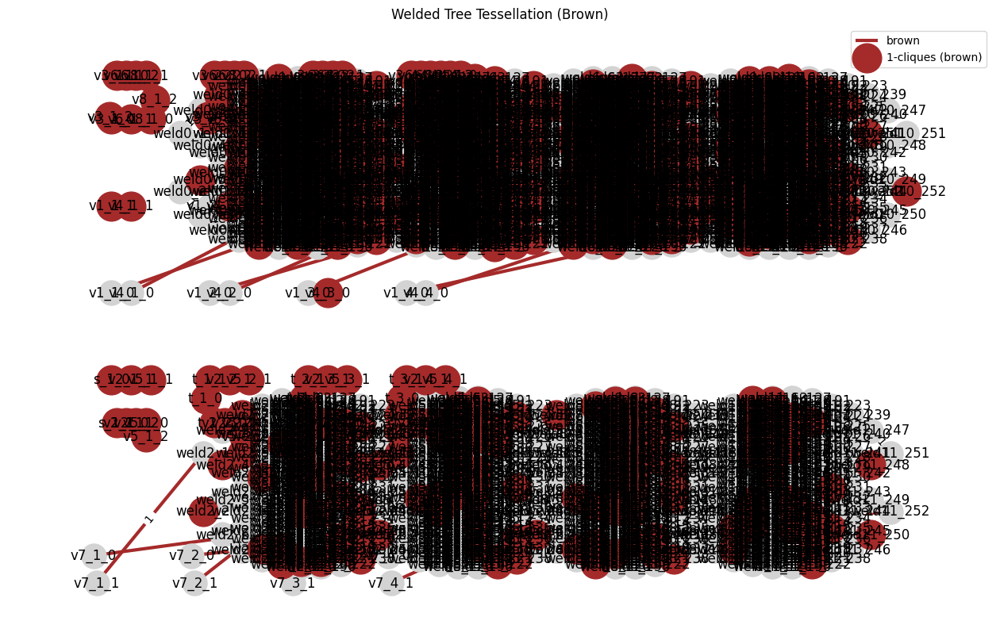

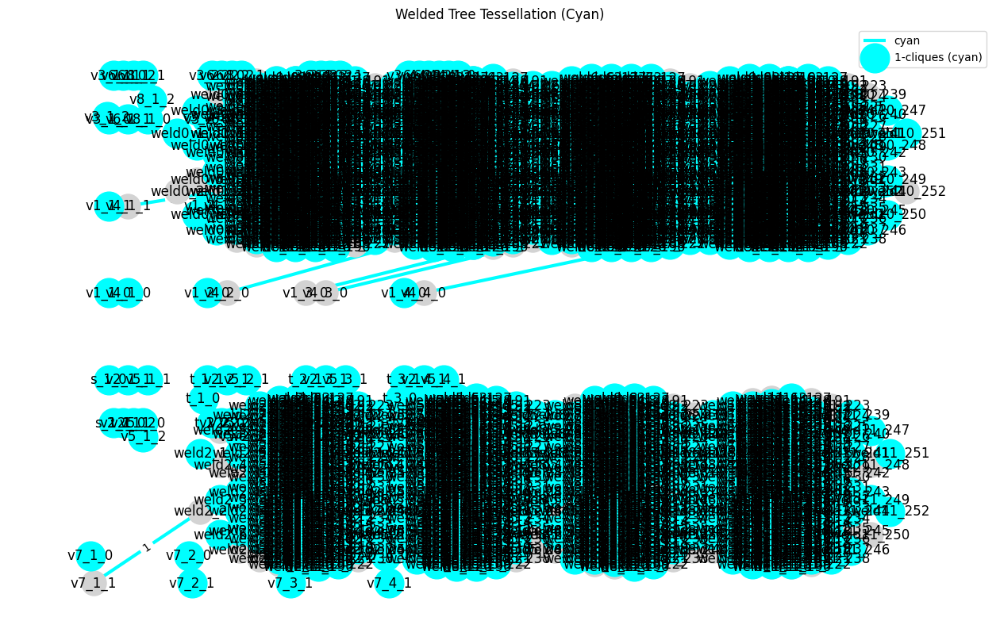


--- Checking for edges in a clique tessellation that connect different polygons ---
No edges in a clique tessellation connect nodes from different polygons.

--- Checking for edges appearing in more than one tessellation ---
Edge overlap check complete.


In [20]:
import matplotlib.pyplot as plt

def compute_k_tessellations_layers(G, pos, k=4, split_last_vertex=True):
    """
    Partition the edges of G into k matchings (2-cliques), i.e., k tessellations.
    Optionally splits the last vertex (exit node) into two vertices (t1, t2) connected by a new edge.
    Returns a list of tessellations, each as a list of edges, and the modified graph and positions.
    Each tessellation is a true matching: no two edges share a node.
    """
    G_mod = G.copy()
    pos_mod = pos.copy()

    # --- Split the last vertex (exit node) into t1 and t2 ---
    if split_last_vertex and len(G_mod.nodes) > 0:
        last_layer_x = max(pos[n][0] for n in pos)
        last_layer_nodes = [n for n in pos if abs(pos[n][0] - last_layer_x) < 1e-6]
        if len(last_layer_nodes) == 1:
            t = last_layer_nodes[0]
            neighbors = list(G_mod.neighbors(t))
            G_mod.remove_node(t)
            pos_mod.pop(t)
            t1 = f"{t}_1"
            t2 = f"{t}_2"
            G_mod.add_node(t1)
            G_mod.add_node(t2)
            G_mod.add_edge(t1, t2)
            for i, nbr in enumerate(neighbors):
                if i % 2 == 0:
                    G_mod.add_edge(t1, nbr)
                else:
                    G_mod.add_edge(t2, nbr)
            x, y = pos[t]
            pos_mod[t1] = (x, y + 0.03)
            pos_mod[t2] = (x, y - 0.03)

    max_layer = int(max(pos_mod[n][0] for n in pos_mod))
    all_layers = []
    for d in range(max_layer + 1):
        all_layers.append([n for n in pos_mod if abs(pos_mod[n][0] - d) < 1e-6])

    tessellations = [[] for _ in range(k)]
    used = [set() for _ in range(k)]

    edges_by_layer = []
    for layer in all_layers:
        layer_edges = []
        for u in layer:
            for v in G_mod.neighbors(u):
                if str(u) < str(v):
                    layer_edges.append((u, v))
        edges_by_layer.append(layer_edges)

    seen = set()
    ordered_edges = []
    for layer_edges in edges_by_layer:
        for edge in layer_edges:
            edge_sorted = tuple(sorted(edge, key=str))
            if edge_sorted not in seen:
                ordered_edges.append(edge_sorted)
                seen.add(edge_sorted)

    # Assign each edge to the first tessellation where both endpoints are unused
    for edge in ordered_edges:
        u, v = edge
        assigned = False
        for i in range(k):
            if u not in used[i] and v not in used[i]:
                tessellations[i].append(edge)
                used[i].add(u)
                used[i].add(v)
                assigned = True
                break
        # If not assigned, skip this edge (do not violate matching property)
        if not assigned:
            pass  # Edge is not included in any tessellation

    return tessellations, G_mod, pos_mod

def get_welded_tree_tessellations(H, welded_nodes, k=4):
    """
    Returns a list of (color, edge list) for each tessellation (matching) in each welded tree.
    Uses only green, orange, brown, cyan.
    """
    import networkx as nx
    color_cycle = ['green', 'orange', 'brown', 'cyan']
    welded_subgraph = H.subgraph(welded_nodes)
    all_tess = []
    for component in nx.connected_components(welded_subgraph):
        G_tree = welded_subgraph.subgraph(component).copy()
        # Use spring_layout for positions if not available
        pos_tree = {n: (0, 0) for n in G_tree.nodes}
        try:
            # Try to use global positions if available
            global_pos = H.graph.get('pos', None)
            if global_pos:
                pos_tree = {n: global_pos[n] for n in G_tree.nodes if n in global_pos}
        except Exception:
            pass
        # Use the matching-based tessellation function
        tessellations, _, _ = compute_k_tessellations_layers(G_tree, pos_tree, k=k, split_last_vertex=False)
        for i, edges in enumerate(tessellations):
            color = color_cycle[i % len(color_cycle)]
            all_tess.append((color, edges))
    return all_tess

# ...existing code...
def get_clique_and_edge_tessellations(H, mapping, welded_nodes):
    """
    Returns:
    - clique_tessellations: list of lists of nodes (each is a polygon/clique outside welded trees)
    - edge_tessellations: list of edges (tuples) between polygons (2-cliques, i.e., blue tessellation)
    """
    welded_set = set(welded_nodes)
    # 1. Polygons (cliques) outside welded trees
    clique_tessellations = []
    for orig, expanded in mapping.items():
        if all(n not in welded_set for n in expanded):
            clique_tessellations.append(list(expanded))
    # 2. Edges between polygons outside welded trees (2-cliques)
    edge_tessellations = []
    seen_edges = set()
    for i, clique1 in enumerate(clique_tessellations):
        for j in range(i+1, len(clique_tessellations)):
            clique2 = clique_tessellations[j]
            for u in clique1:
                for v in clique2:
                    if H.has_edge(u, v):
                        edge = tuple(sorted((u, v)))
                        if edge not in seen_edges:
                            edge_tessellations.append(edge)
                            seen_edges.add(edge)
    return clique_tessellations, edge_tessellations


def assign_edge_colors(H, mapping, welded_nodes):
    """
    Returns a dict: edge -> color for all tessellations, using:
    - red for polygons outside welded trees,
    - blue for edges between polygons outside welded trees,
    - green/orange/brown/cyan for welded tree tessellations,
    - green/orange/brown/cyan for interface edges (between polygon and welded tree),
      ensuring no two edges of the same color are incident to the same node at the interface,
      and interface edges are never blue or red.
    """
    edge_color_dict = {}
    # 1. Clique tessellations (polygons outside welded trees)
    clique_tessellations, edge_tessellations = get_clique_and_edge_tessellations(H, mapping, welded_nodes)
    for clique in clique_tessellations:
        color = 'red'
        clique_edges = [(u, v) for u in clique for v in clique if u < v and H.has_edge(u, v)]
        for e in clique_edges:
            edge_color_dict[tuple(sorted(e))] = color

    # 2. Edge tessellations (edges between polygons outside welded trees)
    for edge in edge_tessellations:
        u, v = tuple(edge)
        edge_color_dict[tuple(sorted((u, v)))] = 'blue'

    # 3. Welded tree tessellations (now using matching-based approach)
    welded_tess = get_welded_tree_tessellations(H, welded_nodes, k=4)
    for color, edges in welded_tess:
        for u, v in edges:
            edge_color_dict[tuple(sorted((u, v)))] = color

    # 4. Color interface edges (between polygon and welded tree) using green/orange/brown/cyan,
    #    ensuring no two edges of the same color are incident to the same node at the interface,
    #    and interface edges are never blue or red.
    welded_set = set(welded_nodes)
    interface_colors = ['green', 'orange', 'brown', 'cyan']
    interface_edges = []
    for u, v in H.edges():
        in_welded_u = u in welded_set
        in_welded_v = v in welded_set
        key = tuple(sorted((u, v)))
        if in_welded_u != in_welded_v and key not in edge_color_dict:
            interface_edges.append((u, v))

    from collections import defaultdict
    node_used_colors = defaultdict(set)
    for (u, v), color in edge_color_dict.items():
        if color in interface_colors:
            node_used_colors[u].add(color)
            node_used_colors[v].add(color)

    for u, v in interface_edges:
        used = node_used_colors[u] | node_used_colors[v]
        for color in interface_colors:
            if color not in used:
                edge_color_dict[tuple(sorted((u, v)))] = color
                node_used_colors[u].add(color)
                node_used_colors[v].add(color)
                break
        else:
            edge_color_dict[tuple(sorted((u, v)))] = interface_colors[0]
            node_used_colors[u].add(interface_colors[0])
            node_used_colors[v].add(interface_colors[0])

    return edge_color_dict

# --- Compute tessellations and plot ---
welded_nodes = [n for n in H_chain_welded.nodes if "weld" in str(n)]
clique_tessellations, edge_tessellations = get_clique_and_edge_tessellations(H_chain, mapping_chain, welded_nodes)
edge_color_dict = assign_edge_colors(H_chain_welded, mapping_chain, welded_nodes)

# --- Check for node overlaps and duplicate edges in green tessellation ---
green_edges = []
for (u, v), color in edge_color_dict.items():
    if color == 'green':
        green_edges.append((u, v))

nodes_in_green = set()
overlap_found = False
for u, v in green_edges:
    if u in nodes_in_green or v in nodes_in_green:
        print(f"Green tessellation is not a matching! Edge ({u}, {v}) shares a node.")
        overlap_found = True
    nodes_in_green.add(u)
    nodes_in_green.add(v)
if not overlap_found:
    print("Green tessellation: no node overlaps (matching OK).")

edge_set = set(tuple(sorted((u, v))) for u, v in green_edges)
if len(edge_set) != len(green_edges):
    print("Duplicate edges found in green tessellation!")
else:
    print("Green tessellation: no duplicate edges.")

# ...rest of your code unchanged...

# ...rest of your code unchanged...

def plot_all_tessellations(H, pos, edge_color_dict, title="All Tessellations (Red/Blue outside, Green/Orange/Brown/Cyan inside welded trees)", initial_state=None):
    plt.figure(figsize=(20, 12))
    # Set node colors: yellow for initial_state, else as before
    node_colors = []
    for n in H.nodes():
        if initial_state is not None and (
            (isinstance(initial_state, (list, set)) and n in initial_state) or n == initial_state
        ):
            node_colors.append('yellow')
        else:
            node_colors.append('lightgrey')
    nx.draw_networkx_nodes(H, pos, node_color=node_colors, node_size=500)
    # Draw colored edges and their weights
    color_edges = {}
    for (u, v), color in edge_color_dict.items():
        color_edges.setdefault(color, []).append((u, v))
    for color, edges in color_edges.items():
        edges_in_H = [e for e in edges if H.has_edge(*e)]
        if not edges_in_H:
            continue
        nx.draw_networkx_edges(H, pos, edgelist=edges_in_H, edge_color=color, width=3, label=color)
        edge_labels = {(u, v): H[u][v].get('weight', 1) for u, v in edges_in_H}
        nx.draw_networkx_edge_labels(H, pos, edge_labels=edge_labels, font_color='black')
    # Draw uncolored (interface) edges in default color (grey) and their weights
    colored_edges = set([tuple(sorted(e)) for e in edge_color_dict.keys()])
    uncolored_edges = [e for e in H.edges() if tuple(sorted(e)) not in colored_edges]
    if uncolored_edges:
        nx.draw_networkx_edges(H, pos, edgelist=uncolored_edges, edge_color='grey', width=2, style='dashed', label='interface')
        edge_labels = {(u, v): H[u][v].get('weight', 1) for u, v in uncolored_edges}
        nx.draw_networkx_edge_labels(H, pos, edge_labels=edge_labels, font_color='black')
    # Draw isolated vertices (1-cliques)
    for node in H.nodes():
        if H.degree[node] == 0:
            nx.draw_networkx_nodes(H, pos, nodelist=[node], node_color='red', node_size=700)
    nx.draw_networkx_labels(H, pos)
    plt.title(title)
    plt.axis('off')
    plt.legend()
    plt.show()

# --- Compute tessellations and plot ---
welded_nodes = [n for n in H_chain_welded.nodes if "weld" in str(n)]
clique_tessellations, edge_tessellations = get_clique_and_edge_tessellations(H_chain, mapping_chain, welded_nodes)
edge_color_dict = assign_edge_colors(H_chain_welded, mapping_chain, welded_nodes)

plot_all_tessellations(
    H_chain_welded,
    pos_H_chain_welded,
    edge_color_dict,
    title="All Tessellations (Red/Blue outside, Green/Orange/Brown/Cyan inside welded trees)"
)

# --- Plot each tessellation separately ---
for color, label in [
    ('red', "Polygons (Red) Tessellation"),
    ('blue', "Edges Between Polygons (Blue) Tessellation"),
    ('green', "Welded Tree Tessellation (Green)"),
    ('orange', "Welded Tree Tessellation (Orange)"),
    ('brown', "Welded Tree Tessellation (Brown)"),
    ('cyan', "Welded Tree Tessellation (Cyan)")
]:
    plt.figure(figsize=(16, 10))
    nx.draw_networkx_nodes(H_chain_welded, pos_H_chain_welded, node_color='lightgrey', node_size=500)
    edges = [e for e, c in edge_color_dict.items() if c == color and H_chain_welded.has_edge(*e)]
    if edges:
        nx.draw_networkx_edges(H_chain_welded, pos_H_chain_welded, edgelist=edges, edge_color=color, width=3, label=color)
        edge_labels = {(u, v): H_chain_welded[u][v].get('weight', 1) for u, v in edges}
        nx.draw_networkx_edge_labels(H_chain_welded, pos_H_chain_welded, edge_labels=edge_labels, font_color='black')
    colored_edges = set([tuple(sorted(e)) for e in edge_color_dict.keys() if edge_color_dict[e] == color])
    uncolored_edges = [e for e in H_chain_welded.edges() if tuple(sorted(e)) not in edge_color_dict]
    if color in ['blue', 'red']:
        if uncolored_edges:
            nx.draw_networkx_edges(H_chain_welded, pos_H_chain_welded, edgelist=uncolored_edges, edge_color='grey', width=2, style='dashed', label='interface')
            edge_labels = {(u, v): H_chain_welded[u][v].get('weight', 1) for u, v in uncolored_edges}
            nx.draw_networkx_edge_labels(H_chain_welded, pos_H_chain_welded, edge_labels=edge_labels, font_color='black')
    nodes_with_colored_edge = set()
    for u, v in edges:
        nodes_with_colored_edge.add(u)
        nodes_with_colored_edge.add(v)
    all_nodes = set(H_chain_welded.nodes())
    one_clique_nodes = list(all_nodes - nodes_with_colored_edge)
    if one_clique_nodes:
        nx.draw_networkx_nodes(H_chain_welded, pos_H_chain_welded, nodelist=one_clique_nodes, node_color=color, node_size=700, label=f"1-cliques ({color})")
    nx.draw_networkx_labels(H_chain_welded, pos_H_chain_welded)
    plt.title(label)
    plt.axis('off')
    plt.legend()
    plt.show()

# --- Check tessellation edge consistency ---
def check_tessellation_edge_consistency(H, clique_tessellations, edge_tessellations):
    print("\n--- Checking for edges in a clique tessellation that connect different polygons ---")
    node_to_clique = {}
    for i, clique in enumerate(clique_tessellations):
        for node in clique:
            node_to_clique[node] = i
    bad_edges = []
    for i, clique in enumerate(clique_tessellations):
        for u in clique:
            for v in clique:
                if u < v and H.has_edge(u, v):
                    continue
                elif u != v and H.has_edge(u, v):
                    if node_to_clique[u] != node_to_clique[v]:
                        bad_edges.append((u, v))
    if bad_edges:
        print("Found edges in a clique tessellation connecting nodes from different polygons:")
        for u, v in bad_edges:
            print(f"  Edge {u} -- {v}")
    else:
        print("No edges in a clique tessellation connect nodes from different polygons.")

    print("\n--- Checking for edges appearing in more than one tessellation ---")
    edge_sets = []
    for clique in clique_tessellations:
        edges = set()
        for u in clique:
            for v in clique:
                if u < v and H.has_edge(u, v):
                    edges.add(tuple(sorted((u, v))))
        edge_sets.append(edges)
    for edge in edge_tessellations:
        u, v = tuple(edge)
        if H.has_edge(u, v):
            edge_sets.append({tuple(sorted((u, v)))})
    all_edges = {}
    for idx, edges in enumerate(edge_sets):
        for e in edges:
            if e in all_edges:
                print(f"Edge {e} appears in tessellation {all_edges[e]} and {idx}")
            else:
                all_edges[e] = idx
    print("Edge overlap check complete.")

check_tessellation_edge_consistency(H_chain_welded, clique_tessellations, edge_tessellations)

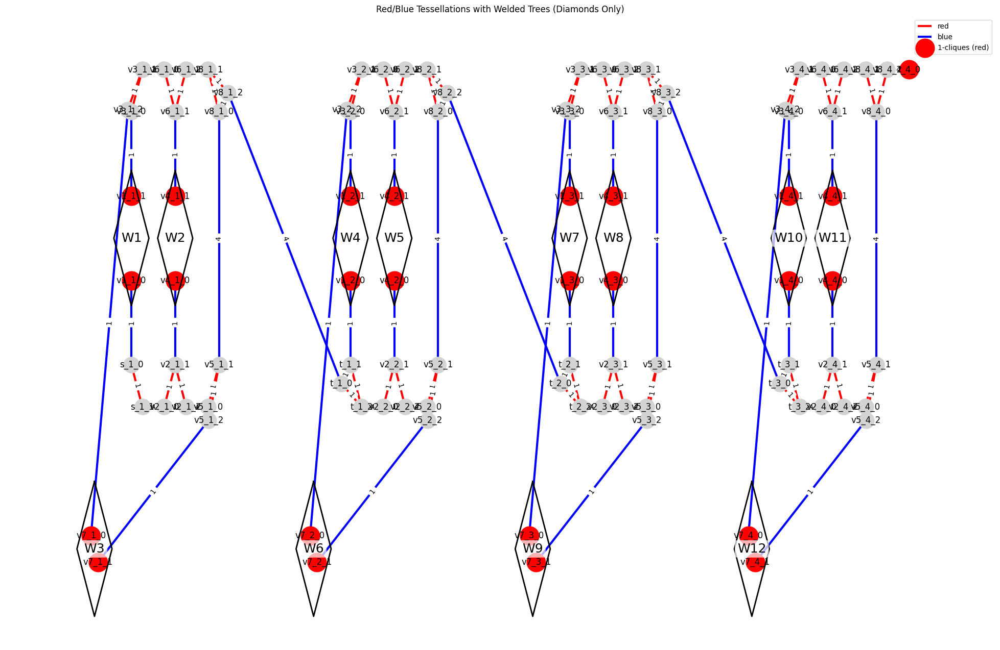

In [21]:
def plot_red_blue_with_diamonds_only_outside(H, pos, edge_color_dict, pairs, welded_nodes, clique_tessellations, title="Red/Blue Tessellations with Welded Trees (Diamonds Only)"):
    plt.figure(figsize=(25, 16))
    welded_set = set(welded_nodes)
    # Only draw nodes outside welded trees
    outside_nodes = [n for n in H.nodes() if n not in welded_set]
    nx.draw_networkx_nodes(H, pos, nodelist=outside_nodes, node_color='lightgrey', node_size=500)
    # Only draw red/blue edges where both endpoints are outside welded trees
    for color in ['red', 'blue']:
        edges = [
            e for e, c in edge_color_dict.items()
            if c == color and H.has_edge(*e) and e[0] in outside_nodes and e[1] in outside_nodes
        ]
        if edges:
            nx.draw_networkx_edges(H, pos, edgelist=edges, edge_color=color, width=3, label=color)
            edge_labels = {(u, v): H[u][v].get('weight', 1) for u, v in edges}
            nx.draw_networkx_edge_labels(H, pos, edge_labels=edge_labels, font_color='black')
    # Draw 1-cliques for red tessellation (outside welded trees)
    nodes_with_colored_edge = set()
    red_edges = [
        e for e, c in edge_color_dict.items()
        if c == 'red' and H.has_edge(*e) and e[0] in outside_nodes and e[1] in outside_nodes
    ]
    for u, v in red_edges:
        nodes_with_colored_edge.add(u)
        nodes_with_colored_edge.add(v)
    one_clique_nodes = []
    for clique in clique_tessellations:
        for node in clique:
            if node not in nodes_with_colored_edge and node in outside_nodes:
                one_clique_nodes.append(node)
    if one_clique_nodes:
        nx.draw_networkx_nodes(H, pos, nodelist=one_clique_nodes, node_color='red', node_size=700, label="1-cliques (red)")
    nx.draw_networkx_labels(H, pos, labels={n: n for n in outside_nodes})
    # Draw diamonds for welded trees
    for idx, (vj_0, vj_1) in enumerate(pairs):
        if vj_0 in pos and vj_1 in pos:
            x0, y0 = pos[vj_1]
            x1, y1 = pos[vj_0]
            center_x = (x0 + x1) / 2
            center_y = (y0 + y1) / 2
            size = 0.4
            diamond = [
                (center_x, center_y + size),
                (center_x + size, center_y),
                (center_x, center_y - size),
                (center_x - size, center_y),
                (center_x, center_y + size)
            ]
            xs, ys = zip(*diamond)
            plt.plot(xs, ys, color='black', linewidth=2)
            plt.text(center_x, center_y, f"W{idx+1}", fontsize=18, ha='center', va='center', color='black',
                     bbox=dict(facecolor='white', edgecolor='none', alpha=0.7, boxstyle='round,pad=0.2'))
    plt.title(title)
    plt.axis('off')
    plt.legend()
    plt.show()

# Call the function with the correct arguments
plot_red_blue_with_diamonds_only_outside(
    H_chain_welded,
    pos_H_chain_welded,
    edge_color_dict,
    pairs,
    welded_nodes,
    clique_tessellations,
    title="Red/Blue Tessellations with Welded Trees (Diamonds Only)"
)

Removed edge between s_1_1 and v2_1_0


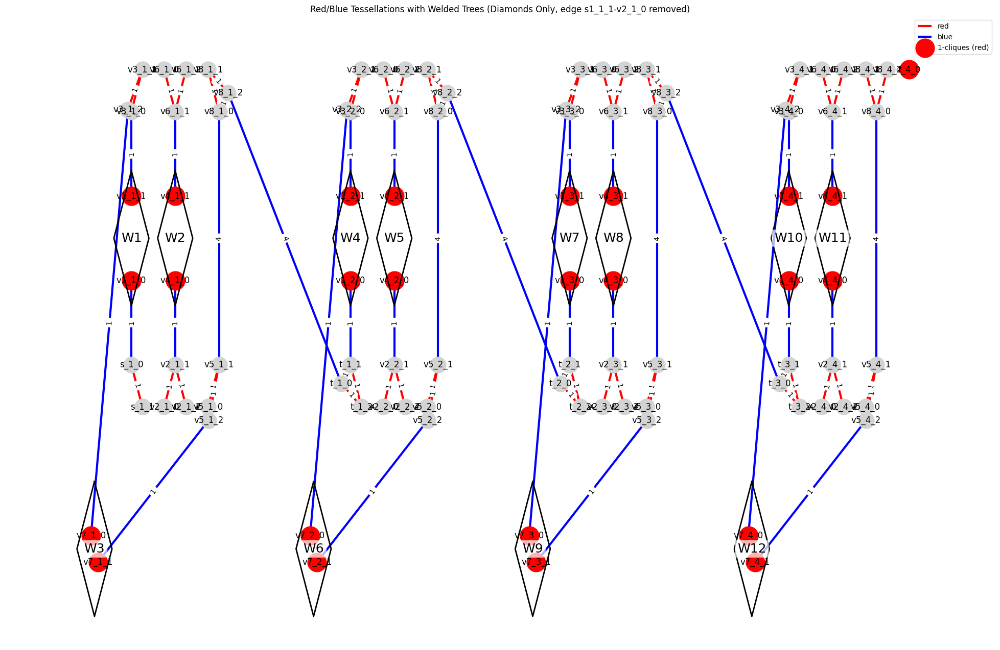

In [22]:
def erase_edge_between_cliques_and_update_tessellations(H, mapping, orig_u, orig_v, clique_tessellations, edge_tessellations):
    """
    Removes the edge between the cliques of orig_u and orig_v in H,
    and updates the edge_tessellations (removes the corresponding 2-clique).
    Returns the new graph, updated clique_tessellations, and updated edge_tessellations.
    """
    import networkx as nx

    H_new = H.copy()
    nodes_u = set(mapping[orig_u])
    nodes_v = set(mapping[orig_v])
    removed_edge = None

    # Remove the edge between the cliques
    for u in nodes_u:
        for v in nodes_v:
            if H_new.has_edge(u, v):
                H_new.remove_edge(u, v)
                removed_edge = {u, v}
                print(f"Removed edge between {u} and {v}")
                break
        if removed_edge:
            break
    if not removed_edge:
        print("No edge found between the specified cliques.")

    # Update edge_tessellations: remove the corresponding 2-clique
    edge_tessellations_new = []
    for edge in edge_tessellations:
        if removed_edge is not None and set(edge) == removed_edge:
            continue  # Remove this 2-clique
        edge_tessellations_new.append(edge)

    # clique_tessellations remain unchanged (since only blue tessellations are affected)
    return H_new, clique_tessellations, edge_tessellations_new

# Remove the edge s1_1_1 - v2_1_0 and update tessellations accordingly
H_removed, clique_tessellations_removed, edge_tessellations_removed = erase_edge_between_cliques_and_update_tessellations(
    H_chain_welded, mapping_chain, 's_1', 'v2_1', clique_tessellations, edge_tessellations
)

# Recompute welded nodes for the new graph
welded_nodes_removed = [n for n in H_removed.nodes if "weld" in str(n)]

# Recompute edge color dict for the new graph
edge_color_dict_removed = assign_edge_colors(H_removed, mapping_chain, welded_nodes_removed)

# Plot using the same function as in cell 6
plot_red_blue_with_diamonds_only_outside(
    H_removed,
    pos_H_chain_welded,
    edge_color_dict_removed,
    pairs,
    welded_nodes_removed,
    clique_tessellations_removed,
    title="Red/Blue Tessellations with Welded Trees (Diamonds Only, edge s1_1_1-v2_1_0 removed)"
)

In [24]:
def compose_walk_operator_with_marked(H, node_list, tessellations, weights, welded_nodes, edge_color_dict, marked_nodes, theta=np.pi/4):
    """
    Builds the quantum walk operator W = R R_red R_blue R_green R_orange R_brown R_cyan,
    where R = I - 2|t><t| and |t> is the (normalized) state on the marked vertex or clique.
    Uses 6-color tessellation: red/blue outside welded trees, green/orange/brown/cyan inside.
    Prints the color associated to each operator.
    """
    def get_alpha_vectors(tessellation, H, weights, node_list, tess_type, welded_nodes=None):
        alpha_vectors = []
        for clique in tessellation:
            clique = list(clique)
            # No partial tessellation: do not skip any clique
            if tess_type == 'red' and welded_nodes is not None and all(n not in welded_nodes for n in clique):
                ws = []
                for n in clique:
                    w = 0
                    for nbr in H.neighbors(n):
                        if nbr not in clique:
                            w = H[n][nbr].get('weight', 1)
                            break
                    ws.append(w)
                norm = np.sqrt(np.sum(ws))
                vec = np.zeros(len(node_list), dtype=np.complex128)
                for n, w in zip(clique, ws):
                    idx = node_list.index(n)
                    vec[idx] = np.sqrt(w) / norm if norm > 0 else 0
                alpha_vectors.append(vec)
            elif len(clique) == 1:
                vec = np.zeros(len(node_list), dtype=np.complex128)
                idx = node_list.index(clique[0])
                vec[idx] = 1.0
                alpha_vectors.append(vec)
            elif len(clique) == 2:
                vec = np.zeros(len(node_list), dtype=np.complex128)
                idx1 = node_list.index(clique[0])
                idx2 = node_list.index(clique[1])
                vec[idx1] = 1/np.sqrt(2)
                vec[idx2] = 1/np.sqrt(2)
                alpha_vectors.append(vec)
        return alpha_vectors

    def build_projector(alpha_vectors):
        n = len(alpha_vectors[0])
        P = np.zeros((n, n), dtype=np.complex128)
        for vec in alpha_vectors:
            P += np.outer(vec, np.conj(vec))
        return P

    def build_reflection_operator(P):
        n = P.shape[0]
        I = np.eye(n, dtype=np.complex128)
        W = I - 2 * P
        return W

    def build_R(W, theta, color=None):
        n = W.shape[0]
        I = np.eye(n, dtype=np.complex128)
        R = np.cos(theta) * I + 1j * np.sin(theta) * W

        # --- Unitarity check ---
        RdagR = R.conj().T @ R
        if not np.allclose(RdagR, np.eye(n), atol=1e-10):
            print(f"Warning: build_R ({color}) produced a non-unitary operator! Max deviation:", np.max(np.abs(RdagR - np.eye(n))))
        else:
            print(f"build_R: operator ({color}) is unitary (within tolerance).", np.max(np.abs(RdagR - np.eye(n))))

        return R

    # Build R for each tessellation (now includes brown/cyan)
    color_order = ['red', 'blue', 'green', 'orange', 'brown', 'cyan']
    R_list = []
    for tess_type in color_order:
        tess = tessellations.get(tess_type, [])
        if not tess:
            continue
        alpha = get_alpha_vectors(
            tess, H, weights, node_list, tess_type,
            welded_nodes=welded_nodes if tess_type == 'red' else None
        )
        if not alpha:
            continue

        # --- Orthonormality check for |alpha> vectors, print problematic pairs ---
        alpha_mat = np.stack(alpha)
        overlap = alpha_mat @ alpha_mat.conj().T
        max_offdiag = np.max(np.abs(overlap - np.eye(len(alpha))))
        if max_offdiag > 1e-10:
            print(f"Warning: |alpha> vectors for {tess_type} are NOT orthonormal! Max off-diagonal: {max_offdiag:.2e}")
            # Print the problematic pairs and their associated nodes
            for i in range(len(alpha)):
                for j in range(i+1, len(alpha)):
                    val = overlap[i, j]
                    if np.abs(val) > 1e-10:
                        print(f"  Non-orthogonal pair in {tess_type}: |alpha_{i}> and |alpha_{j}>; overlap = {val:.3g}")
                        try:
                            print(f"    Nodes: {tess[i]} and {tess[j]}")
                        except Exception:
                            pass
        else:
            print(f"|alpha> vectors for {tess_type} are orthonormal (max off-diagonal: {max_offdiag:.2e})")

        P = build_projector(alpha)
        W = build_reflection_operator(P)
        R = build_R(W, theta, color=tess_type)
        R_list.append((tess_type, R))

    # Build the marked vertex reflection R = I - 2|t><t|
    n = len(node_list)
    I = np.eye(n, dtype=np.complex128)
    t_vec = np.zeros(n, dtype=np.complex128)
    if isinstance(marked_nodes, (list, set)):
        for t in marked_nodes:
            idx = node_list.index(t)
            t_vec[idx] = 1
        t_vec /= np.linalg.norm(t_vec)
    else:
        idx = node_list.index(marked_nodes)
        t_vec[idx] = 1.0
    P_t = np.outer(t_vec, np.conj(t_vec))
    R_marked = I - 2 * P_t

    print("Operator composition order (from right to left):")
    print("  [marked] * " + " * ".join([color for color, _ in R_list]))

    # Compose W = R_marked * R_red * R_blue * R_green * R_orange * R_brown * R_cyan
    W = R_marked
    for color, R in R_list:
        W = np.dot(R, W)
    return W

# --- Example usage ---
node_list = list(H_chain_welded.nodes)
weights = { (u, v): d.get('weight', 1) for u, v, d in H_chain_welded.edges(data=True) }
green_edges = []
orange_edges = []
brown_edges = []
cyan_edges = []
for (u, v), color in edge_color_dict.items():
    if color == 'green':
        green_edges.append((u, v))
    elif color == 'orange':
        orange_edges.append((u, v))
    elif color == 'brown':
        brown_edges.append((u, v))
    elif color == 'cyan':
        cyan_edges.append((u, v))
tessellations = {
    'red': clique_tessellations,
    'blue': edge_tessellations,
    'green': green_edges,
    'orange': orange_edges,
    'brown': brown_edges,
    'cyan': cyan_edges
}

# Define marked_nodes, e.g., mark all nodes in the t_1 clique
marked_nodes = mapping_chain['t_1']

U = compose_walk_operator_with_marked(
    H_chain_welded, node_list, tessellations, weights, welded_nodes, edge_color_dict, marked_nodes, theta=np.pi/2
)
print("Quantum walk operator U constructed. Shape:", U.shape)

# --- Check unitarity: U^† U (should be close to identity) ---
UdagU = U.conj().T @ U
print("U^† U =\n", UdagU)

|alpha> vectors for red are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (red) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for blue are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (blue) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for green are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (green) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for orange are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (orange) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for brown are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (brown) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for cyan are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (cyan) is unitary (within tolerance). 4.440892098500626e-16
Operator composition order (from right to left):
  [marked] * red * blue * green * orange * brown * cyan
Q


=== Step 1: Current clique s_1 ===
  [RIGHT] Move to v2_1, burn edge s_1-v2_1
Removed edge between s_1_1 and v2_1_0
|alpha> vectors for red are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (red) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for blue are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (blue) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for green are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (green) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for orange are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (orange) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for brown are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (brown) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for cyan are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (cyan) is unitary (within tolerance). 4.440892098

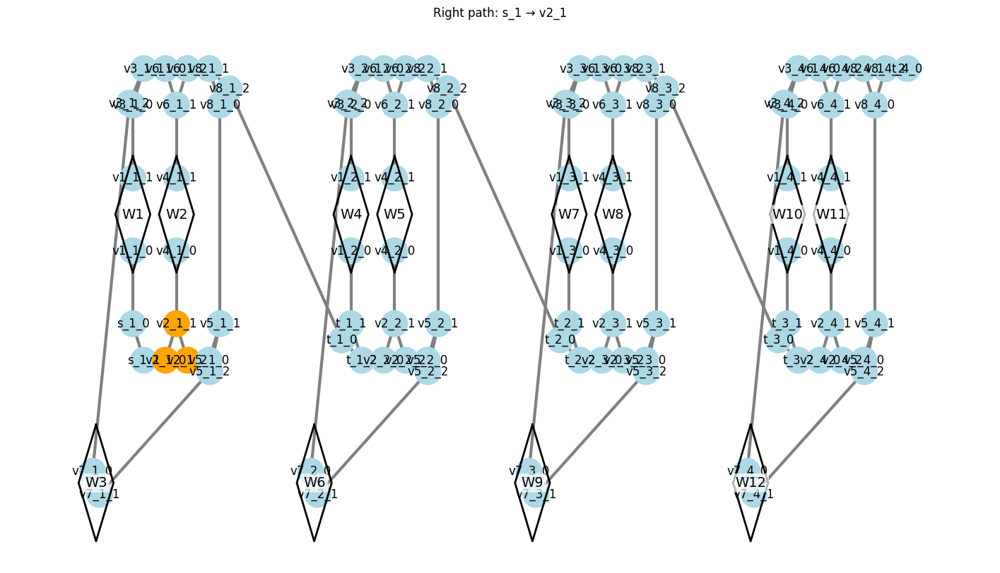

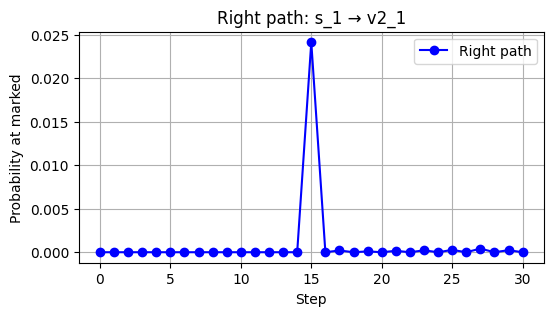

  [LEFT] Move from s_1_0 to welded neighbor v1_1_0, burn edge s_1_0-v1_1_0
|alpha> vectors for red are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (red) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for blue are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (blue) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for green are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (green) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for orange are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (orange) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for brown are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (brown) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for cyan are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (cyan) is unitary (within tolerance). 4.440892098500626e-16
Operator composition order (fro

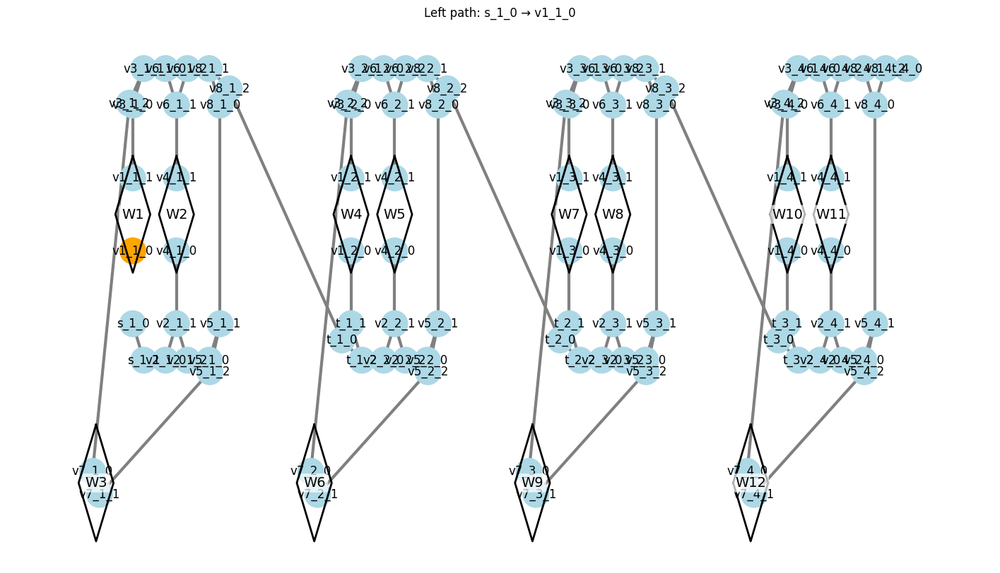

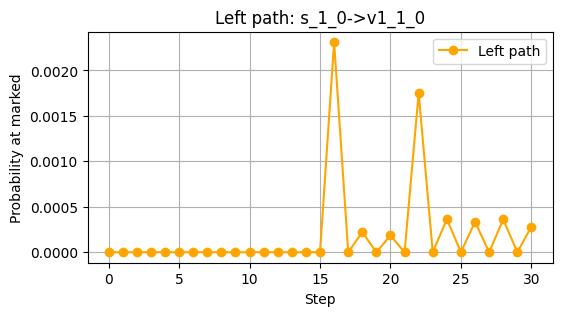


=== Step 2: Current clique v2_1 ===
  [RIGHT] Move to v5_1, burn edge v2_1-v5_1
Removed edge between v2_1_2 and v5_1_0
|alpha> vectors for red are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (red) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for blue are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (blue) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for green are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (green) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for orange are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (orange) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for brown are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (brown) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for cyan are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (cyan) is unitary (within tolerance). 4.440892

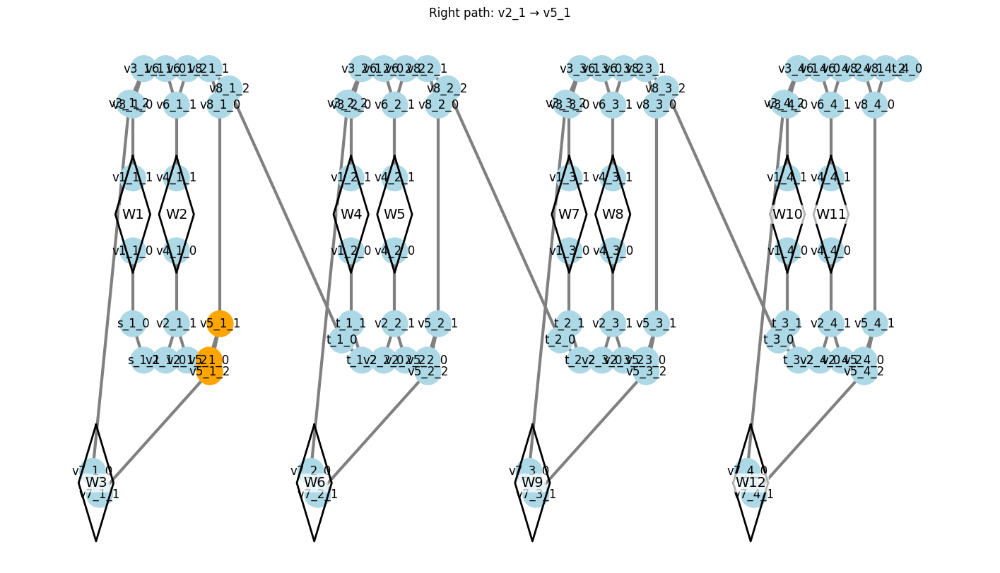

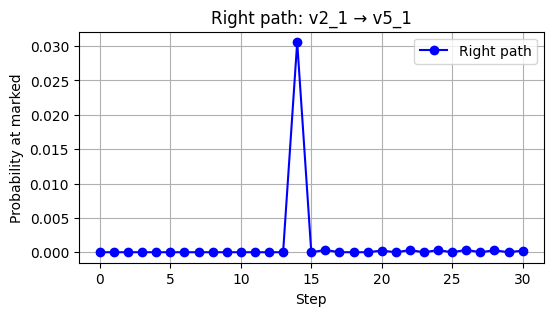

  [LEFT] Move from v2_1_1 to welded neighbor v4_1_0, burn edge v2_1_1-v4_1_0
|alpha> vectors for red are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (red) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for blue are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (blue) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for green are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (green) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for orange are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (orange) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for brown are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (brown) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for cyan are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (cyan) is unitary (within tolerance). 4.440892098500626e-16
Operator composition order (f

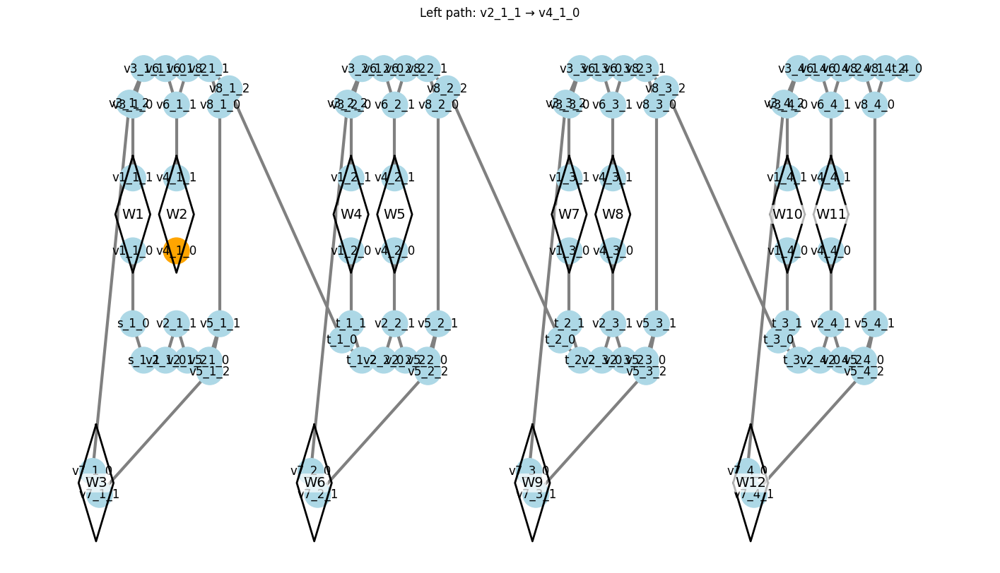

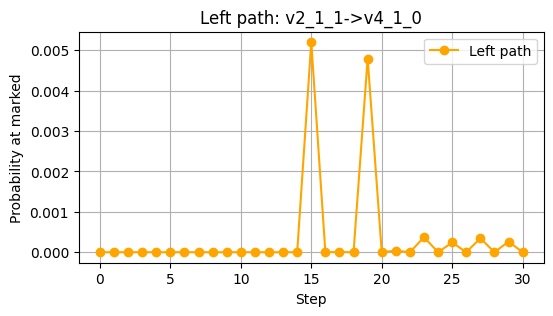


=== Step 3: Current clique v5_1 ===
  [RIGHT] Move to v8_1, burn edge v5_1-v8_1
Removed edge between v5_1_1 and v8_1_0
|alpha> vectors for red are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (red) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for blue are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (blue) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for green are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (green) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for orange are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (orange) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for brown are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (brown) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for cyan are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (cyan) is unitary (within tolerance). 4.440892

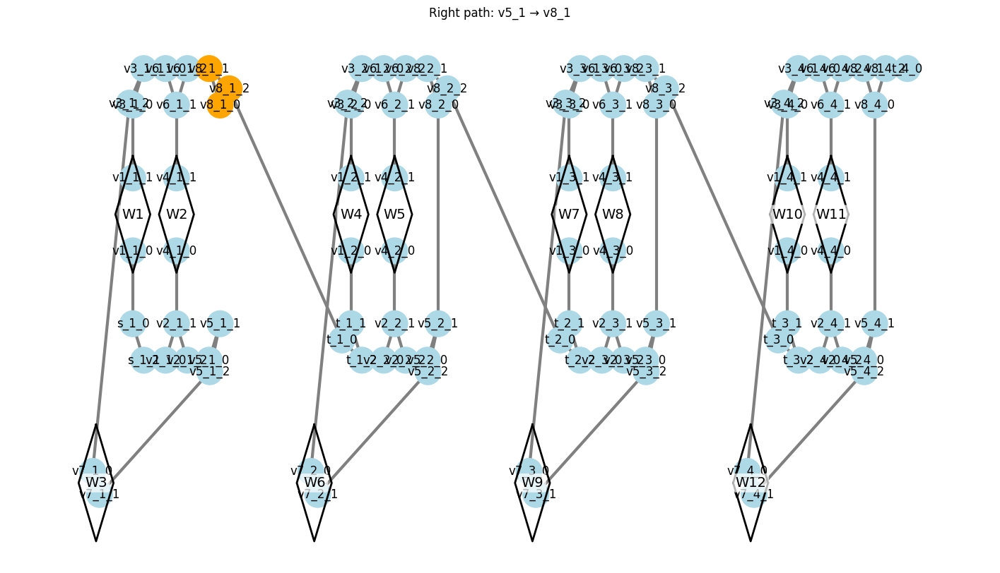

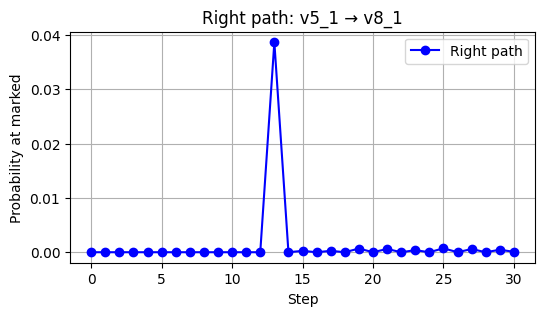

  [LEFT] Move from v5_1_2 to welded neighbor v7_1_1, burn edge v5_1_2-v7_1_1
|alpha> vectors for red are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (red) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for blue are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (blue) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for green are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (green) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for orange are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (orange) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for brown are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (brown) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for cyan are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (cyan) is unitary (within tolerance). 4.440892098500626e-16
Operator composition order (f

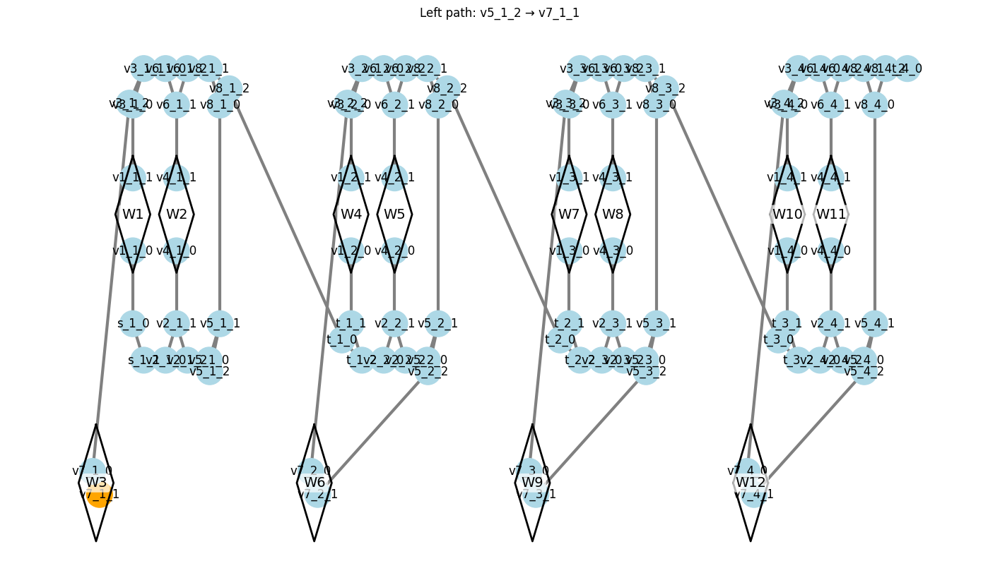

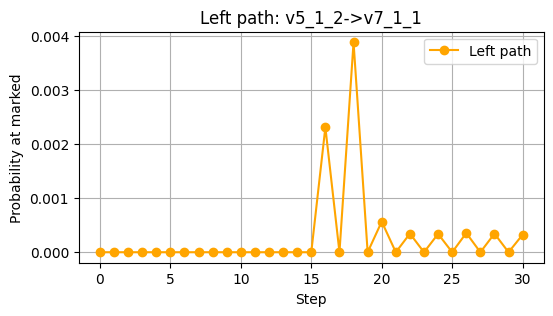


=== Step 4: Current clique v8_1 ===
  [RIGHT] Move to t_1, burn edge v8_1-t_1
Removed edge between v8_1_2 and t_1_0
|alpha> vectors for red are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (red) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for blue are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (blue) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for green are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (green) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for orange are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (orange) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for brown are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (brown) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for cyan are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (cyan) is unitary (within tolerance). 4.440892098

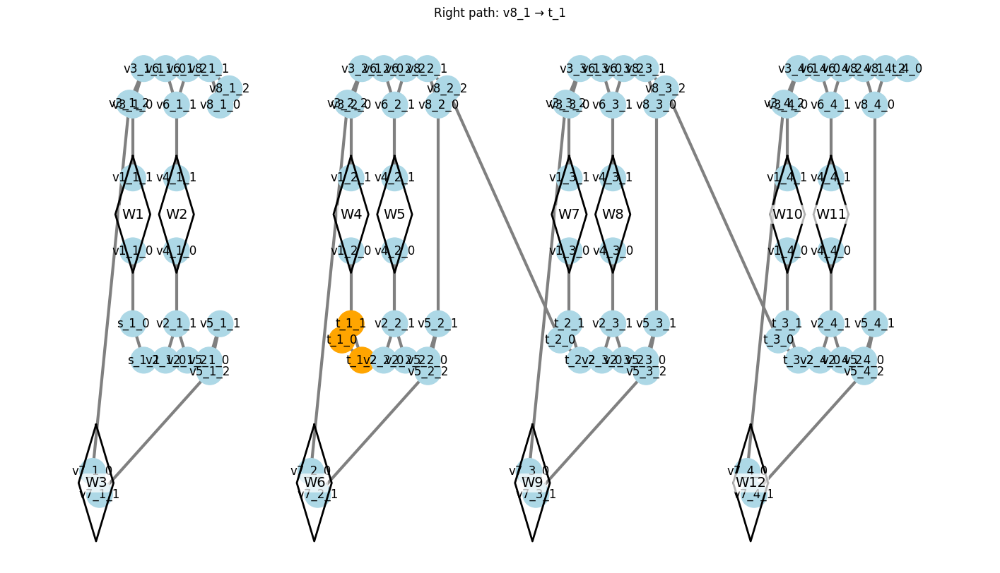

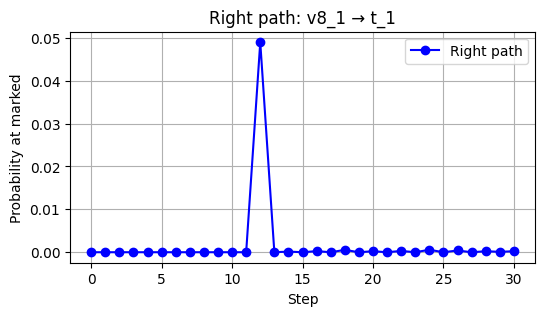

  [LEFT] Try v6 clique: v6_1
|alpha> vectors for red are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (red) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for blue are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (blue) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for green are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (green) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for orange are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (orange) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for brown are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (brown) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for cyan are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (cyan) is unitary (within tolerance). 4.440892098500626e-16
Operator composition order (from right to left):
  [marked] * red * blue * gr

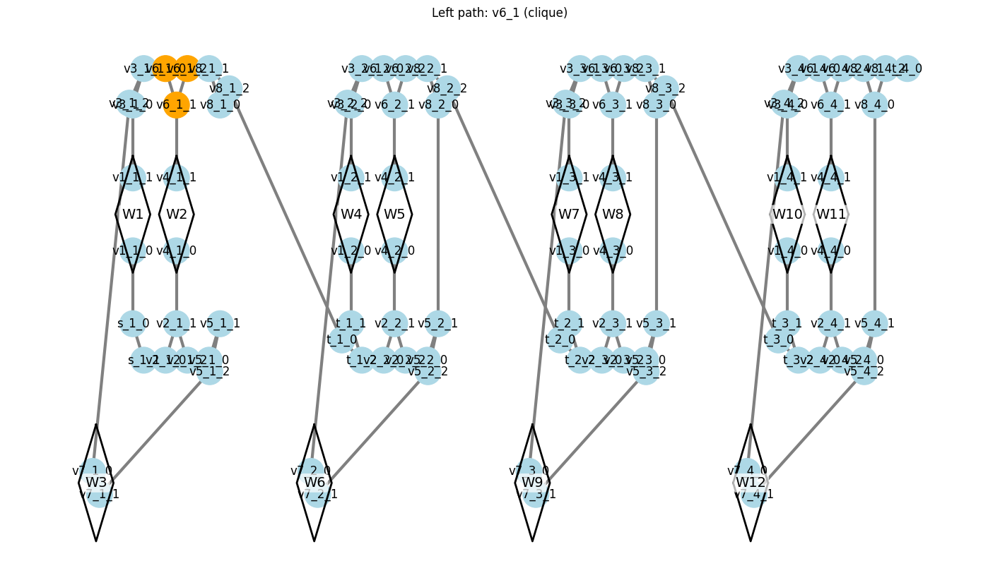

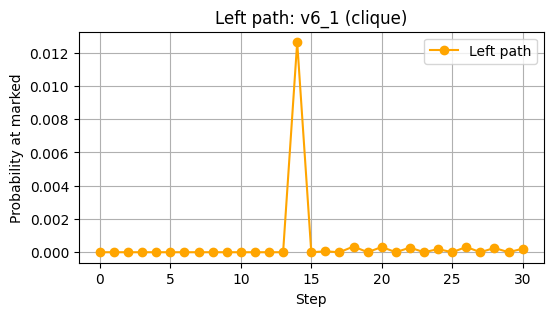


=== Step 5: Current clique t_1 ===
  [RIGHT] Move to v2_2, burn edge t_1-v2_2
Removed edge between t_1_2 and v2_2_0
|alpha> vectors for red are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (red) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for blue are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (blue) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for green are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (green) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for orange are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (orange) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for brown are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (brown) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for cyan are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (cyan) is unitary (within tolerance). 4.440892098

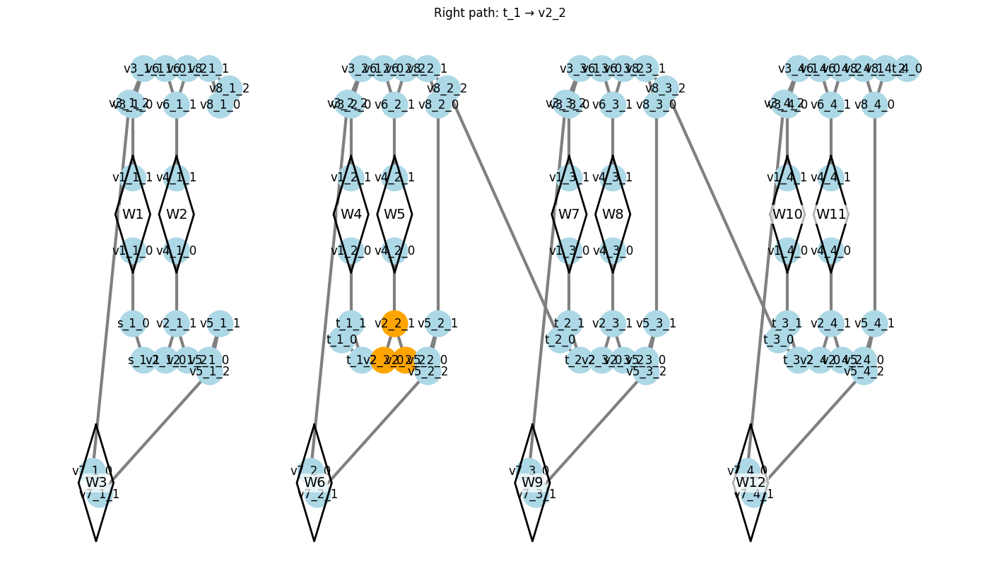

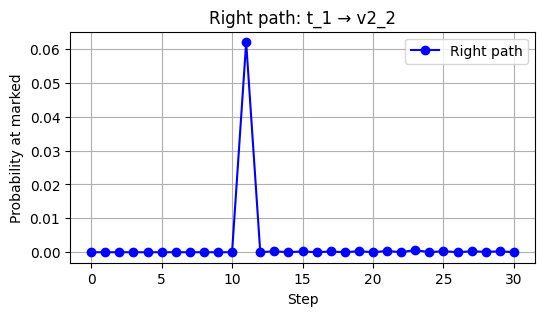

  [LEFT] Move from t_1_1 to welded neighbor v1_2_0, burn edge t_1_1-v1_2_0
|alpha> vectors for red are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (red) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for blue are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (blue) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for green are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (green) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for orange are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (orange) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for brown are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (brown) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for cyan are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (cyan) is unitary (within tolerance). 4.440892098500626e-16
Operator composition order (fro

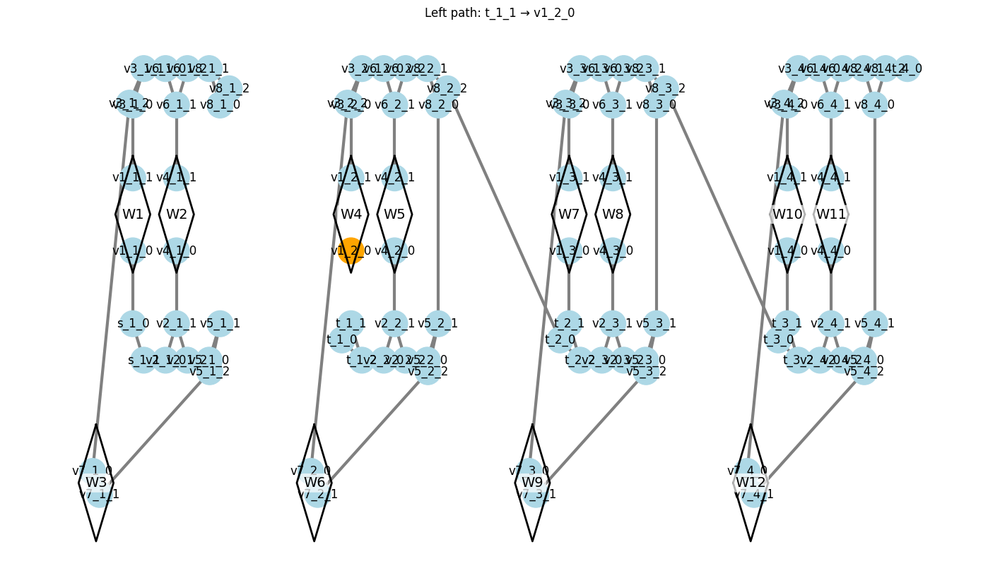

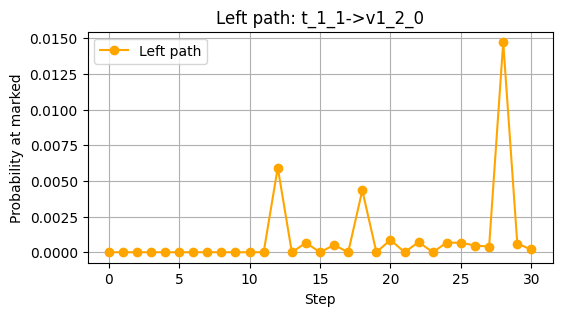


=== Step 6: Current clique v2_2 ===
  [RIGHT] Move to v5_2, burn edge v2_2-v5_2
Removed edge between v2_2_2 and v5_2_0
|alpha> vectors for red are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (red) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for blue are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (blue) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for green are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (green) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for orange are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (orange) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for brown are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (brown) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for cyan are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (cyan) is unitary (within tolerance). 4.440892

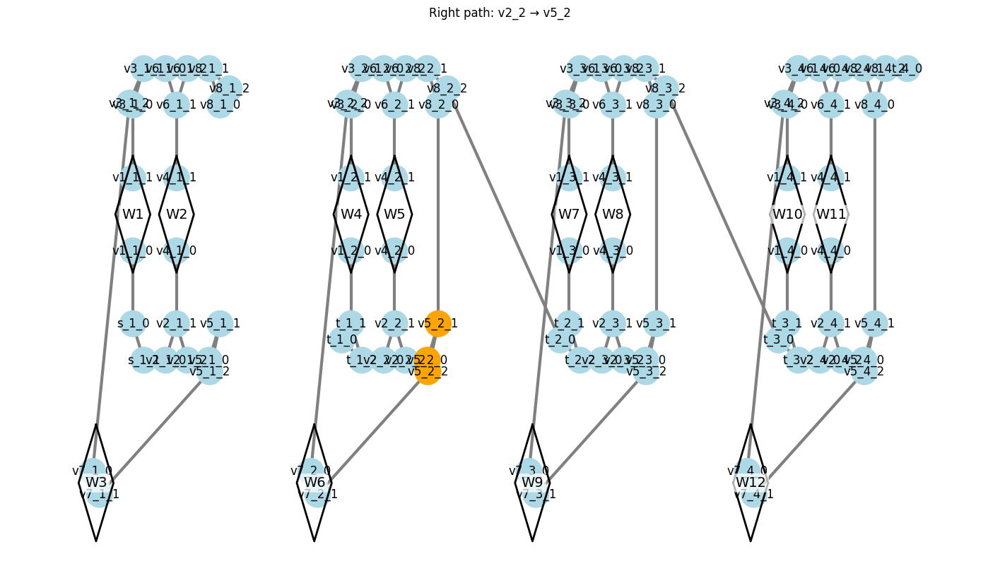

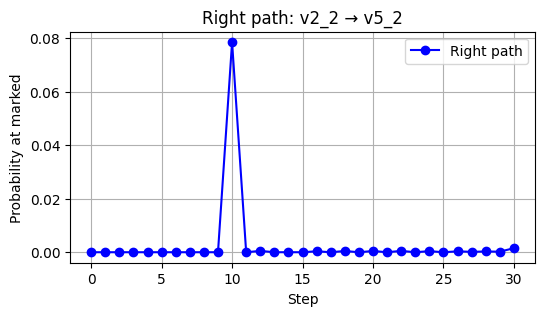

  [LEFT] Move from v2_2_1 to welded neighbor v4_2_0, burn edge v2_2_1-v4_2_0
|alpha> vectors for red are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (red) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for blue are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (blue) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for green are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (green) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for orange are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (orange) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for brown are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (brown) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for cyan are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (cyan) is unitary (within tolerance). 4.440892098500626e-16
Operator composition order (f

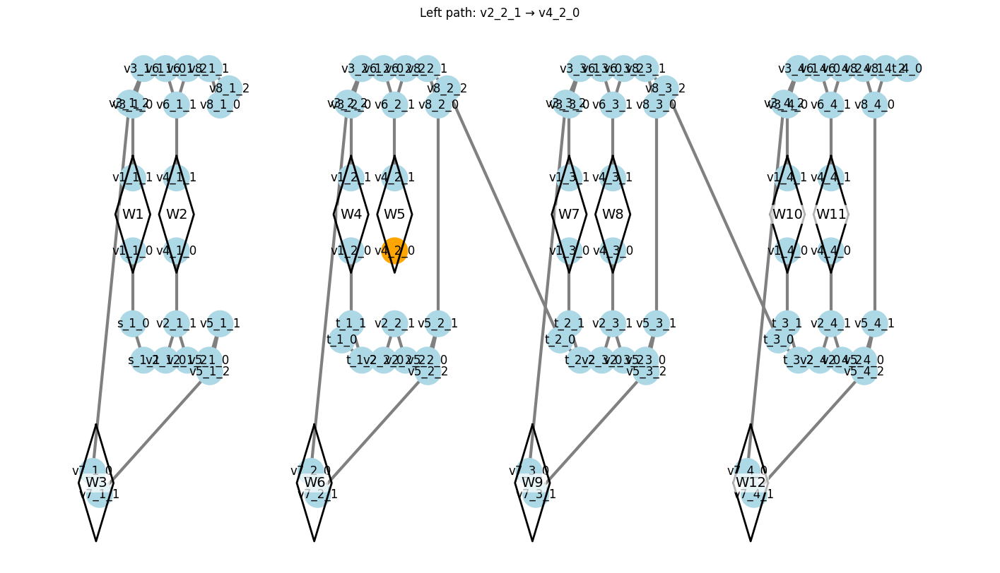

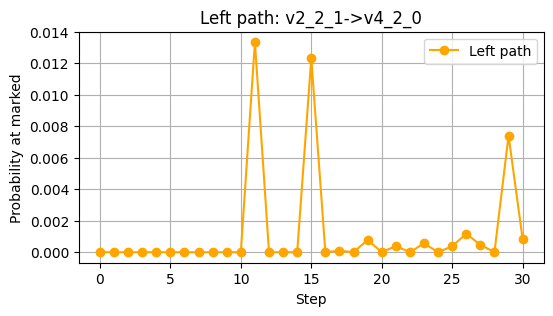


=== Step 7: Current clique v5_2 ===
  [RIGHT] Move to v8_2, burn edge v5_2-v8_2
Removed edge between v5_2_1 and v8_2_0
|alpha> vectors for red are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (red) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for blue are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (blue) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for green are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (green) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for orange are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (orange) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for brown are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (brown) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for cyan are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (cyan) is unitary (within tolerance). 4.440892

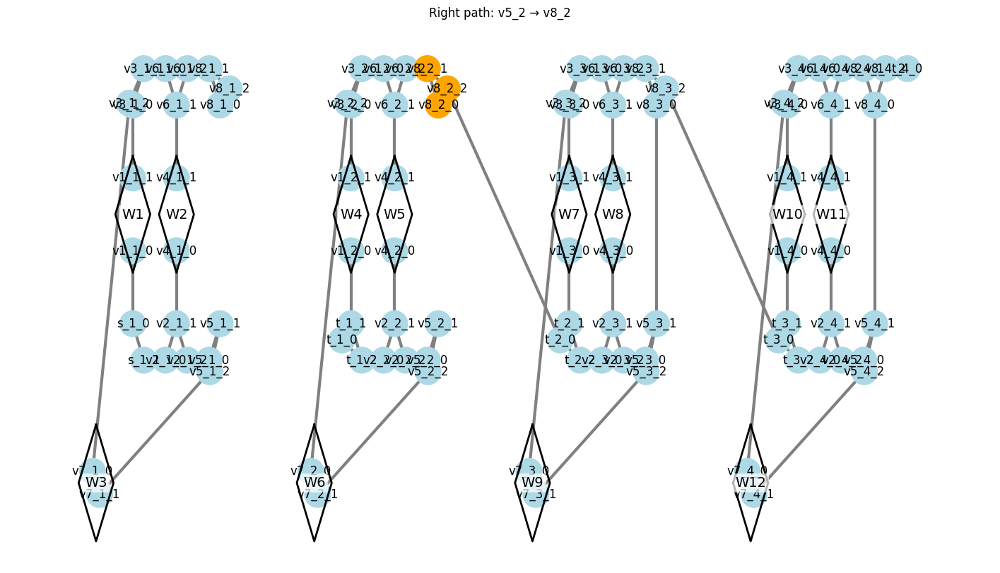

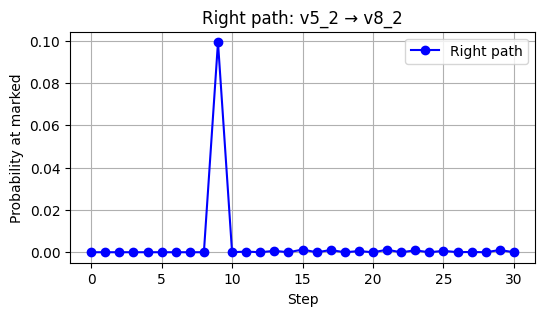

  [LEFT] Move from v5_2_2 to welded neighbor v7_2_1, burn edge v5_2_2-v7_2_1
|alpha> vectors for red are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (red) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for blue are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (blue) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for green are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (green) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for orange are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (orange) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for brown are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (brown) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for cyan are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (cyan) is unitary (within tolerance). 4.440892098500626e-16
Operator composition order (f

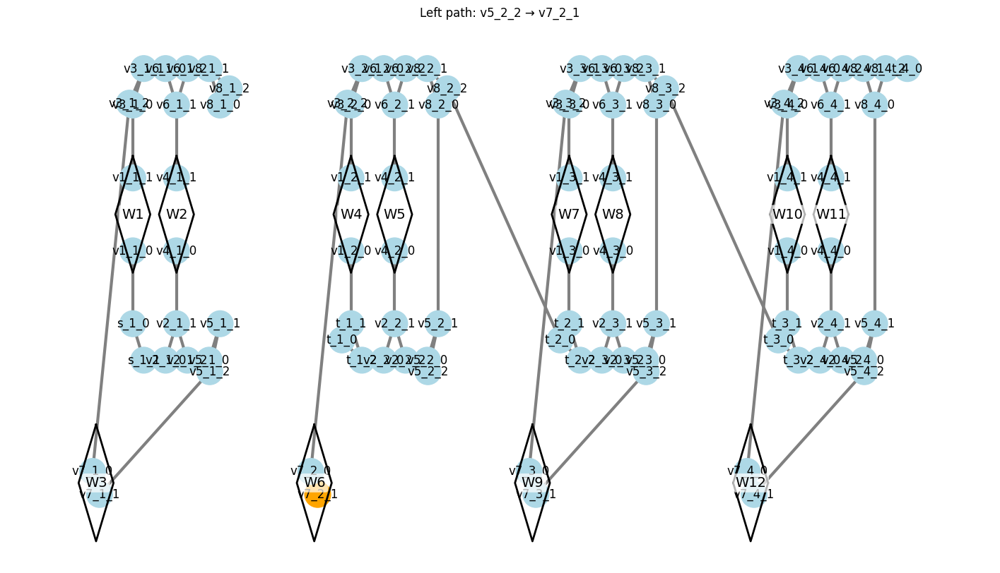

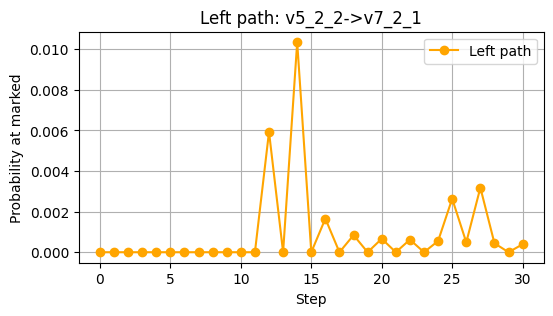


=== Step 8: Current clique v8_2 ===
  [RIGHT] Move to t_2, burn edge v8_2-t_2
Removed edge between v8_2_2 and t_2_0
|alpha> vectors for red are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (red) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for blue are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (blue) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for green are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (green) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for orange are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (orange) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for brown are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (brown) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for cyan are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (cyan) is unitary (within tolerance). 4.440892098

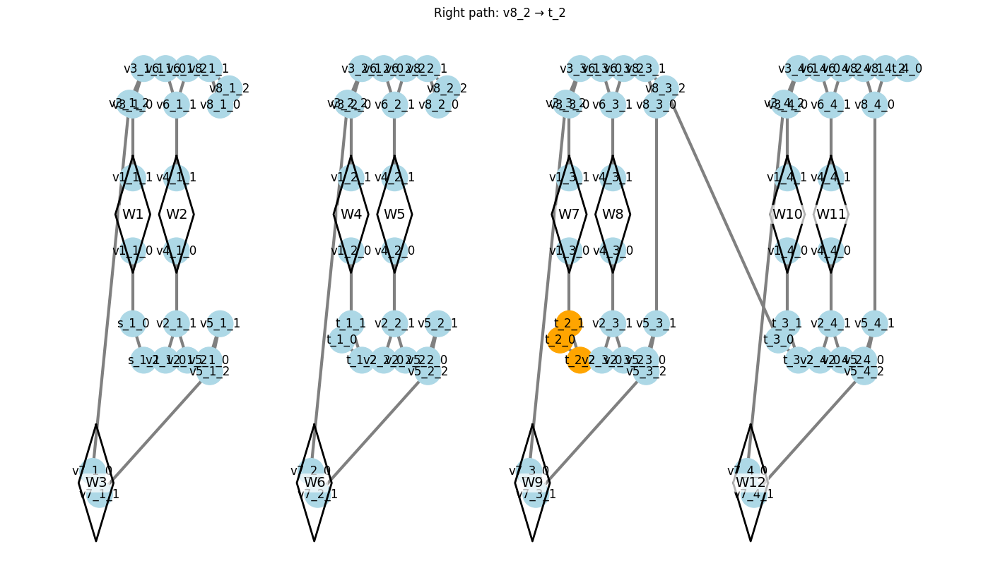

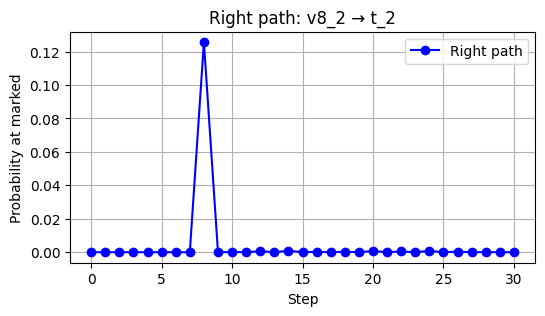

  [LEFT] Try v6 clique: v6_2
|alpha> vectors for red are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (red) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for blue are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (blue) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for green are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (green) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for orange are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (orange) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for brown are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (brown) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for cyan are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (cyan) is unitary (within tolerance). 4.440892098500626e-16
Operator composition order (from right to left):
  [marked] * red * blue * gr

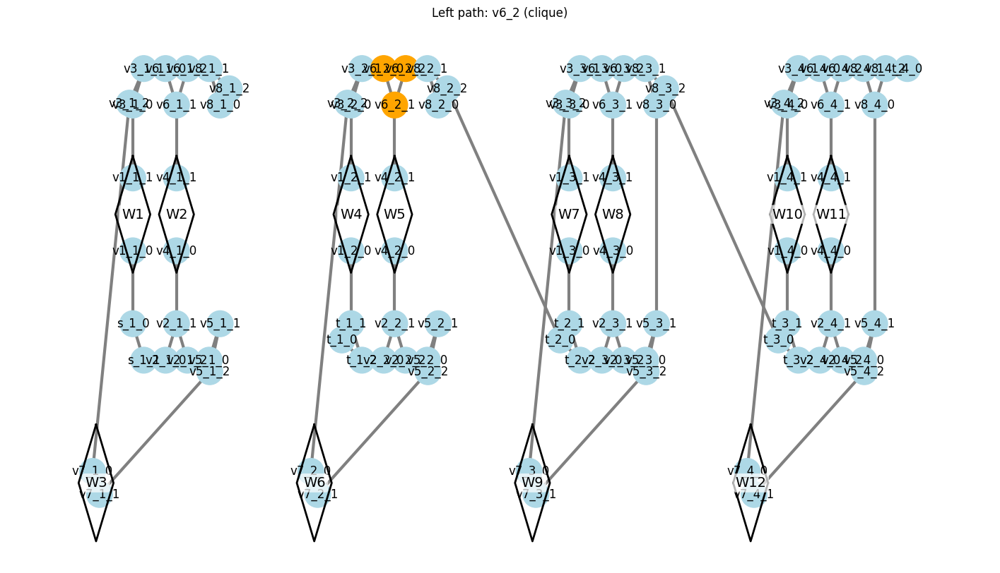

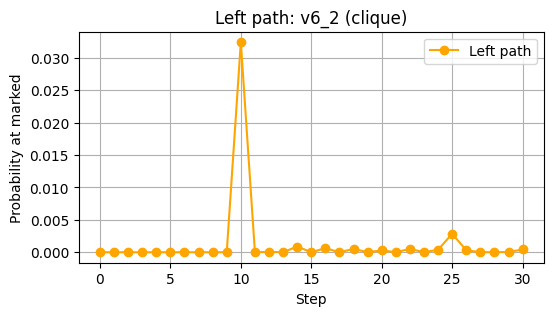


=== Step 9: Current clique t_2 ===
  [RIGHT] Move to v2_3, burn edge t_2-v2_3
Removed edge between t_2_2 and v2_3_0
|alpha> vectors for red are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (red) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for blue are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (blue) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for green are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (green) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for orange are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (orange) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for brown are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (brown) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for cyan are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (cyan) is unitary (within tolerance). 4.440892098

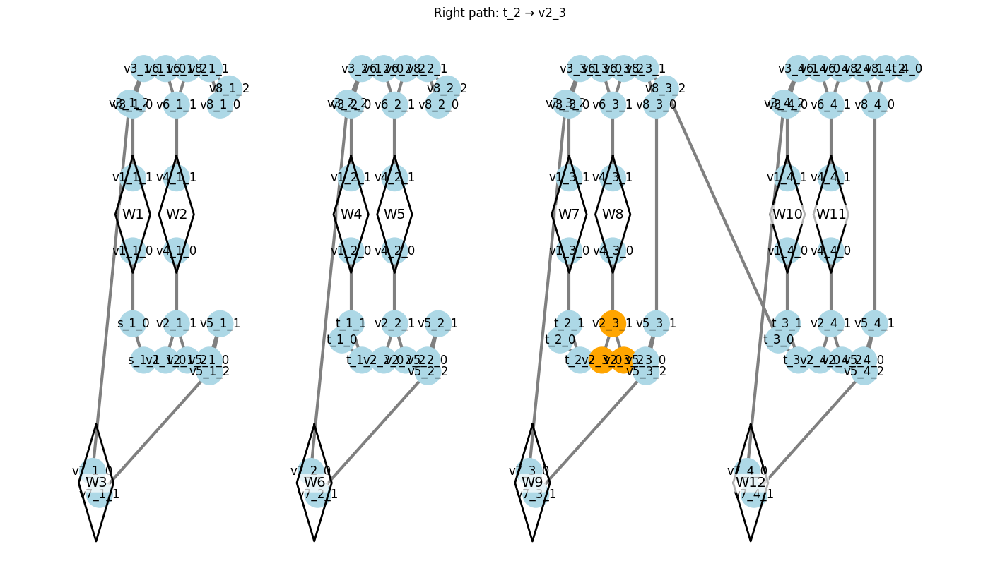

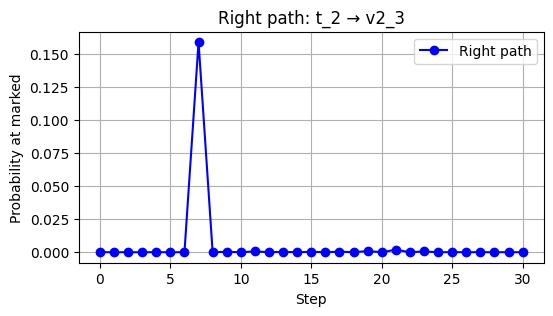

  [LEFT] Move from t_2_1 to welded neighbor v1_3_0, burn edge t_2_1-v1_3_0
|alpha> vectors for red are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (red) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for blue are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (blue) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for green are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (green) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for orange are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (orange) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for brown are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (brown) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for cyan are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (cyan) is unitary (within tolerance). 4.440892098500626e-16
Operator composition order (fro

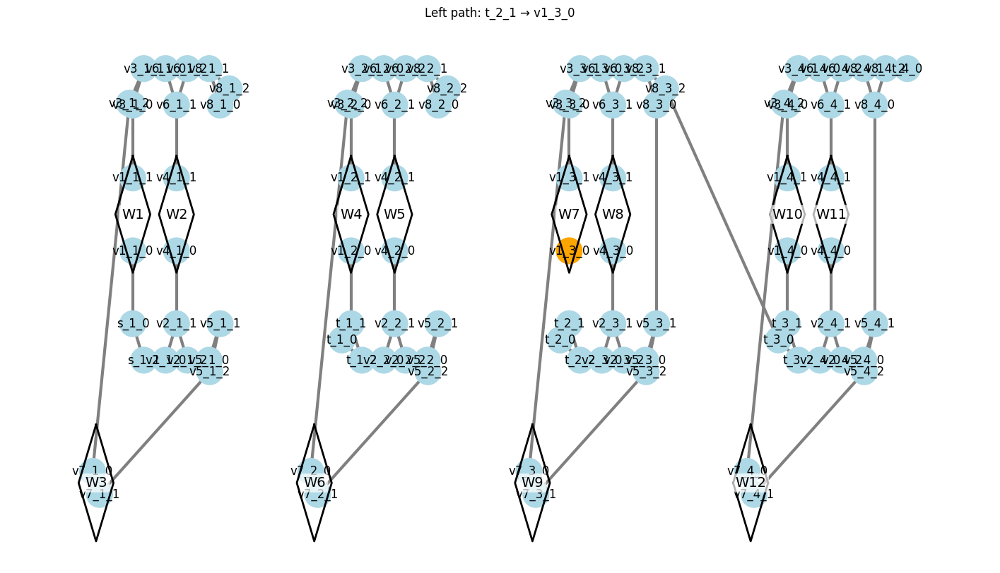

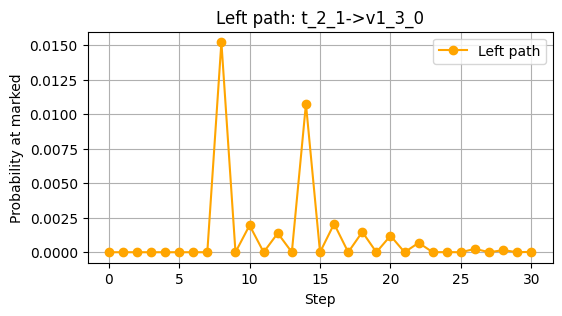


=== Step 10: Current clique v2_3 ===
  [RIGHT] Move to v5_3, burn edge v2_3-v5_3
Removed edge between v2_3_2 and v5_3_0
|alpha> vectors for red are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (red) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for blue are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (blue) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for green are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (green) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for orange are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (orange) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for brown are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (brown) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for cyan are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (cyan) is unitary (within tolerance). 4.44089

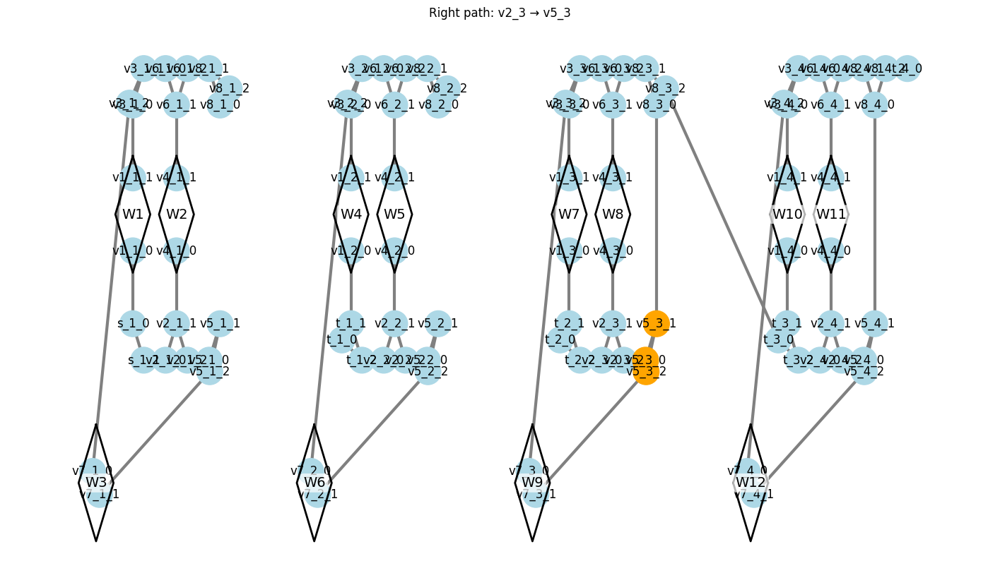

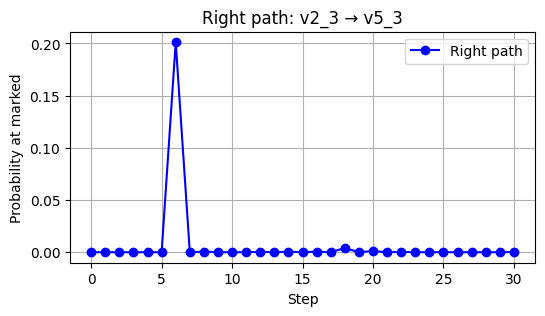

  [LEFT] Move from v2_3_1 to welded neighbor v4_3_0, burn edge v2_3_1-v4_3_0
|alpha> vectors for red are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (red) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for blue are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (blue) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for green are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (green) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for orange are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (orange) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for brown are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (brown) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for cyan are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (cyan) is unitary (within tolerance). 4.440892098500626e-16
Operator composition order (f

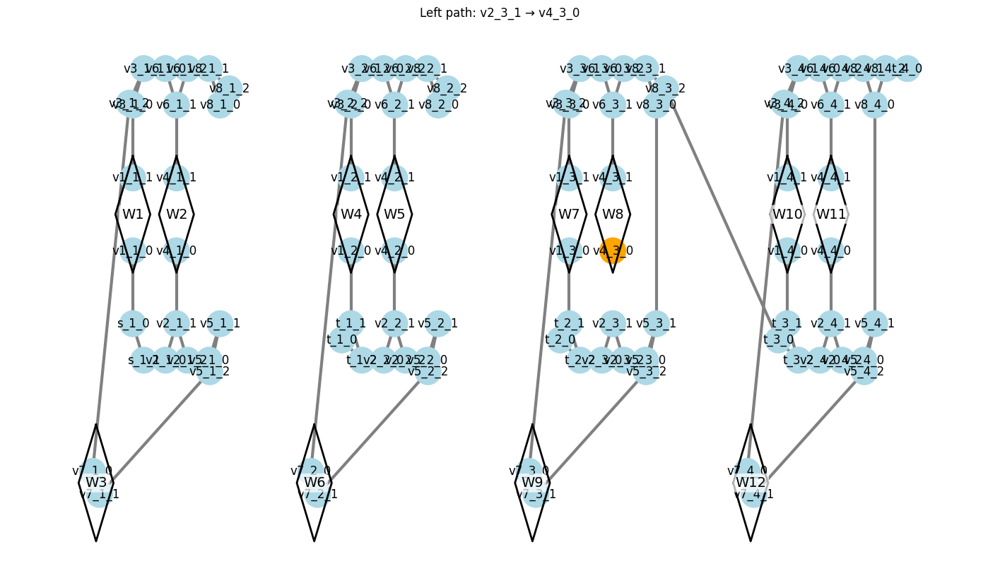

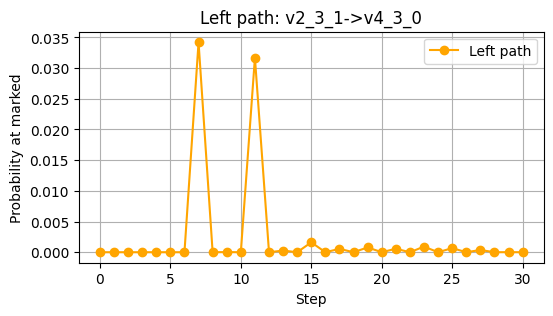


=== Step 11: Current clique v5_3 ===
  [RIGHT] Move to v8_3, burn edge v5_3-v8_3
Removed edge between v5_3_1 and v8_3_0
|alpha> vectors for red are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (red) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for blue are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (blue) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for green are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (green) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for orange are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (orange) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for brown are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (brown) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for cyan are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (cyan) is unitary (within tolerance). 4.44089

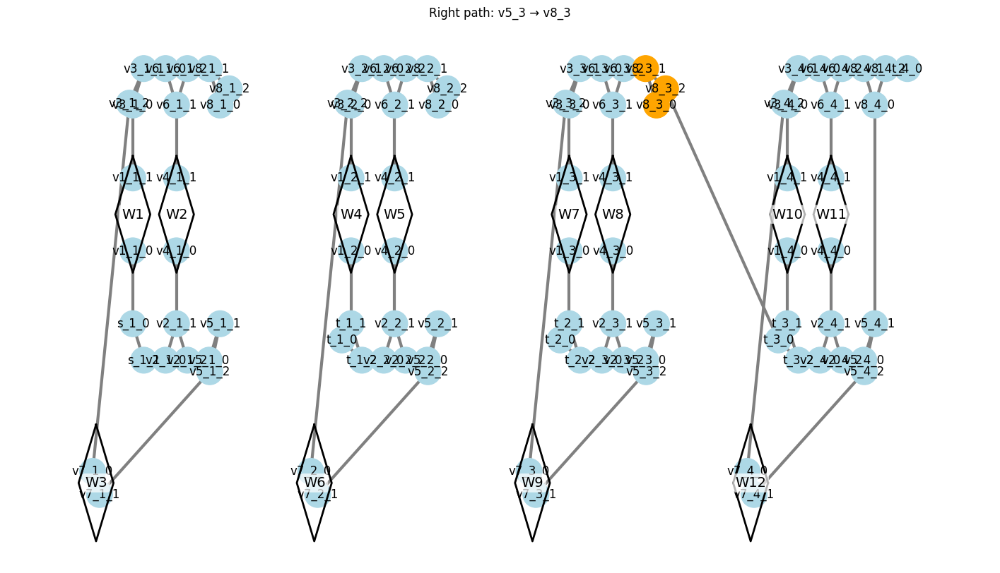

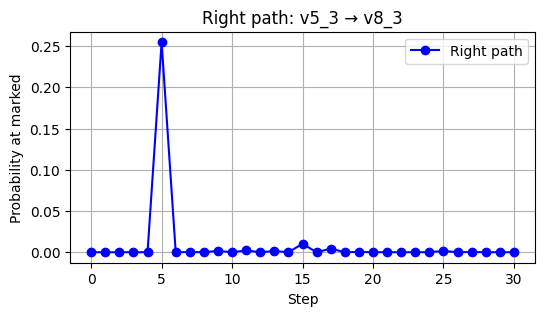

  [LEFT] Move from v5_3_2 to welded neighbor v7_3_1, burn edge v5_3_2-v7_3_1
|alpha> vectors for red are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (red) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for blue are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (blue) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for green are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (green) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for orange are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (orange) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for brown are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (brown) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for cyan are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (cyan) is unitary (within tolerance). 4.440892098500626e-16
Operator composition order (f

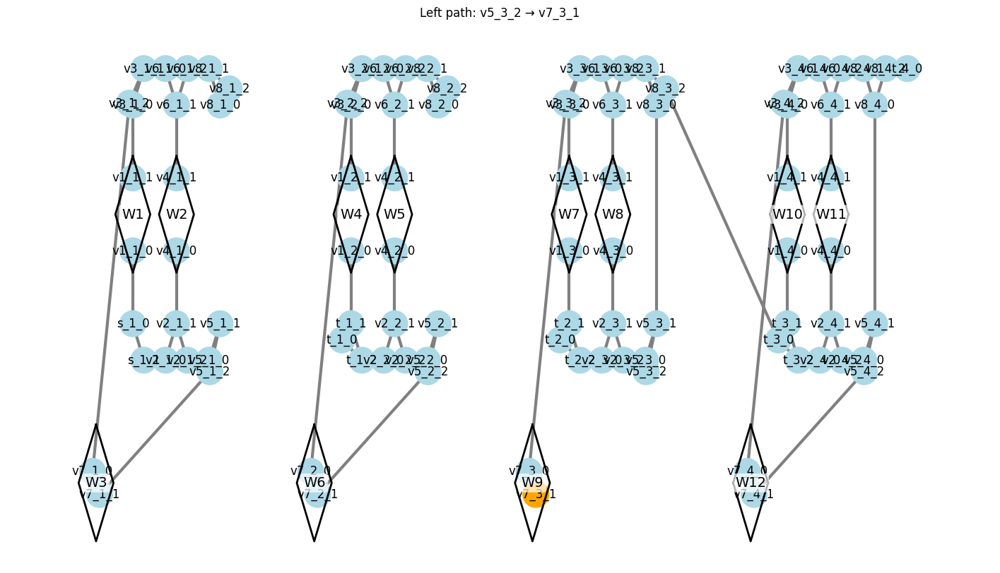

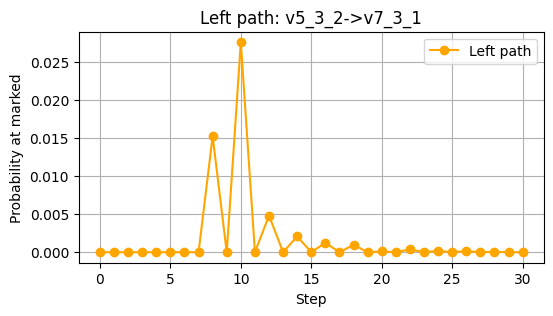


=== Step 12: Current clique v8_3 ===
  [RIGHT] Move to t_3, burn edge v8_3-t_3
Removed edge between v8_3_2 and t_3_0
|alpha> vectors for red are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (red) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for blue are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (blue) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for green are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (green) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for orange are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (orange) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for brown are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (brown) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for cyan are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (cyan) is unitary (within tolerance). 4.44089209

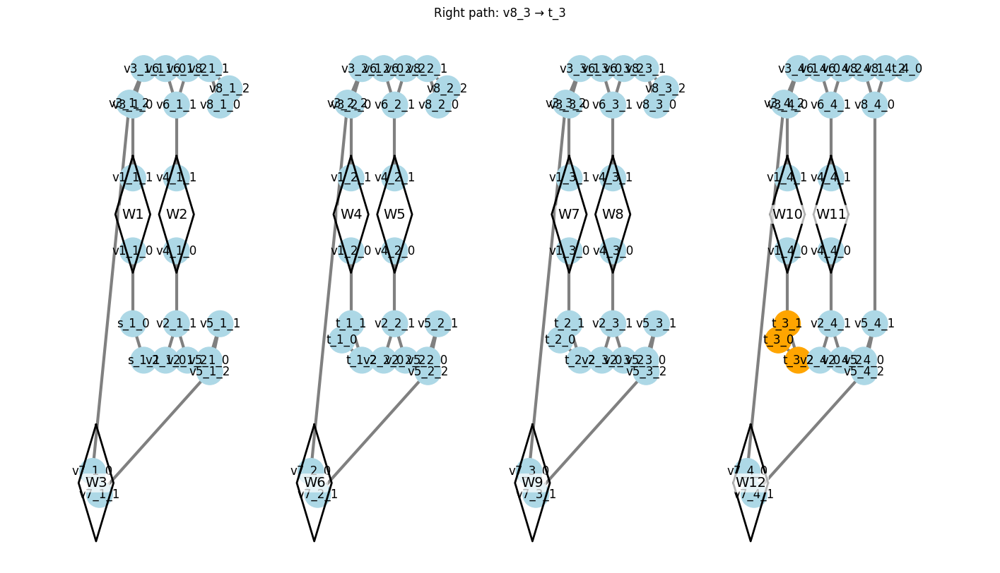

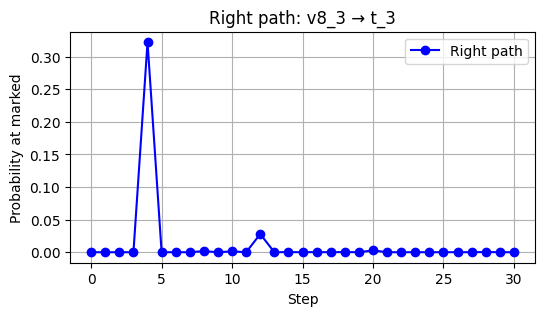

  [LEFT] Try v6 clique: v6_3
|alpha> vectors for red are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (red) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for blue are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (blue) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for green are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (green) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for orange are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (orange) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for brown are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (brown) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for cyan are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (cyan) is unitary (within tolerance). 4.440892098500626e-16
Operator composition order (from right to left):
  [marked] * red * blue * gr

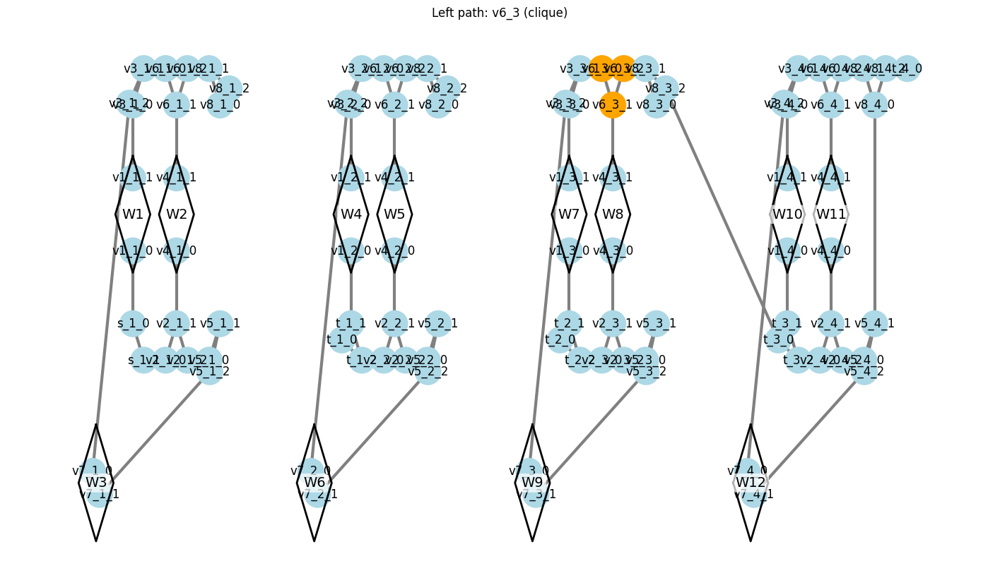

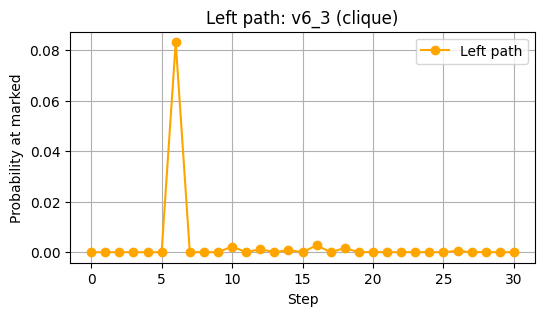


=== Step 13: Current clique t_3 ===
  [RIGHT] Move to v2_4, burn edge t_3-v2_4
Removed edge between t_3_2 and v2_4_0
|alpha> vectors for red are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (red) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for blue are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (blue) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for green are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (green) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for orange are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (orange) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for brown are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (brown) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for cyan are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (cyan) is unitary (within tolerance). 4.44089209

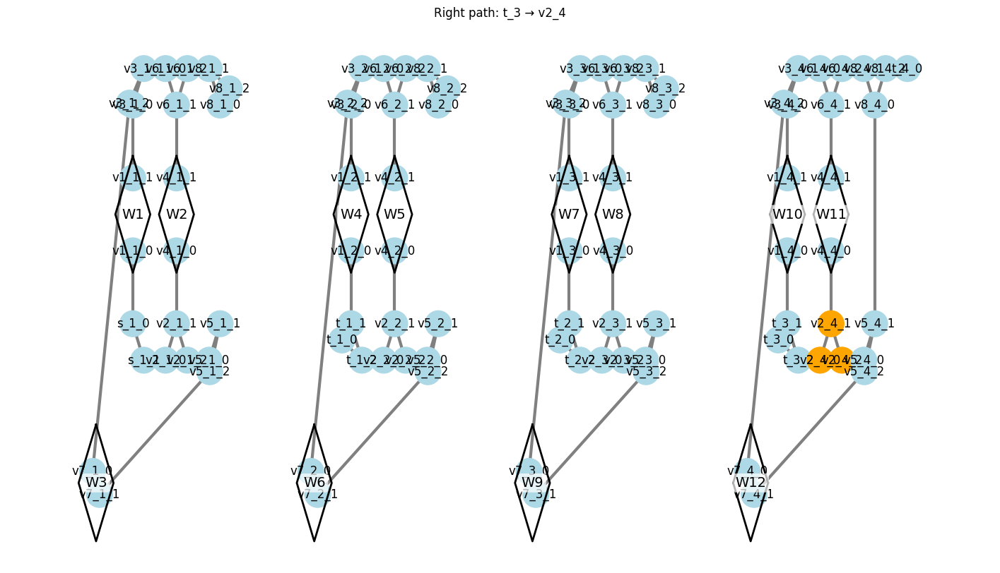

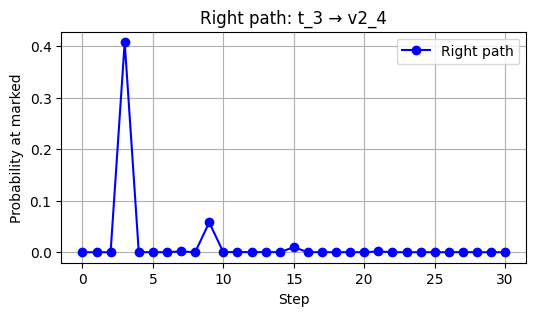

  [LEFT] Move from t_3_1 to welded neighbor v1_4_0, burn edge t_3_1-v1_4_0
|alpha> vectors for red are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (red) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for blue are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (blue) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for green are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (green) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for orange are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (orange) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for brown are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (brown) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for cyan are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (cyan) is unitary (within tolerance). 4.440892098500626e-16
Operator composition order (fro

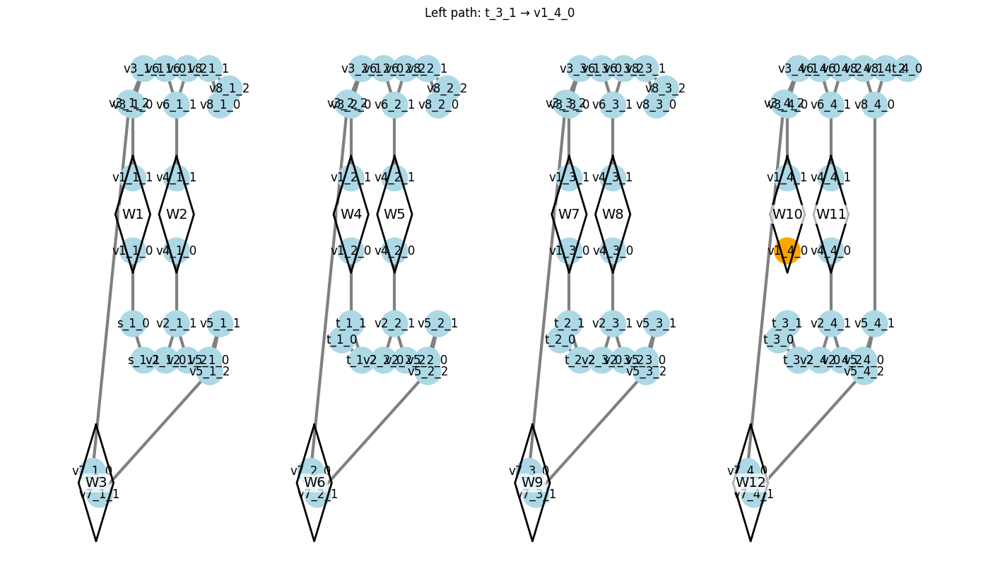

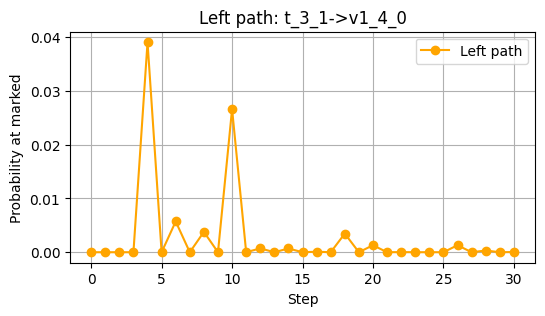


=== Step 14: Current clique v2_4 ===
  [RIGHT] Move to v5_4, burn edge v2_4-v5_4
Removed edge between v2_4_2 and v5_4_0
|alpha> vectors for red are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (red) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for blue are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (blue) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for green are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (green) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for orange are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (orange) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for brown are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (brown) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for cyan are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (cyan) is unitary (within tolerance). 4.44089

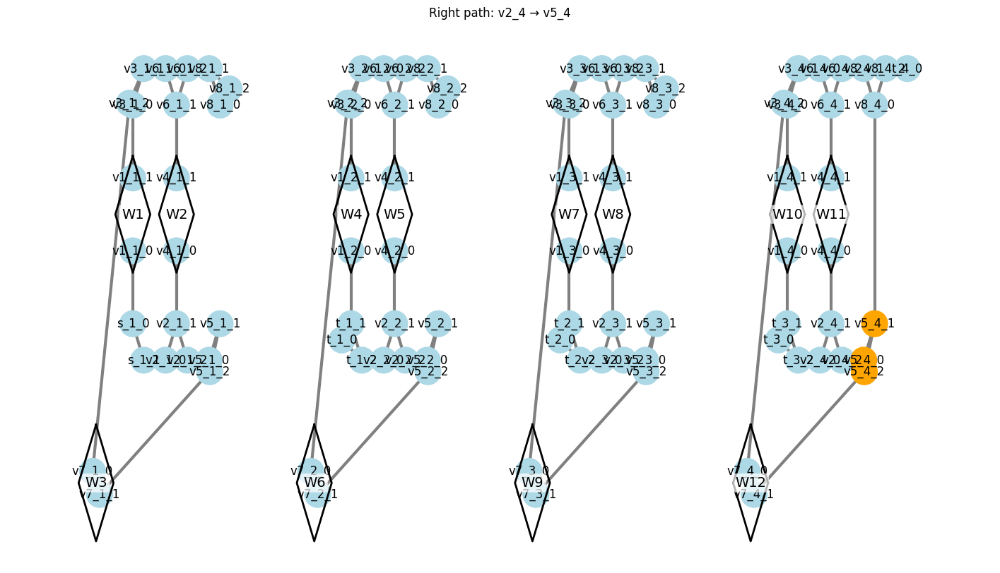

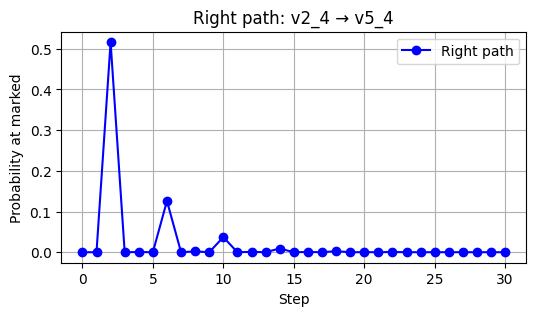

  [LEFT] Move from v2_4_1 to welded neighbor v4_4_0, burn edge v2_4_1-v4_4_0
|alpha> vectors for red are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (red) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for blue are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (blue) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for green are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (green) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for orange are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (orange) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for brown are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (brown) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for cyan are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (cyan) is unitary (within tolerance). 4.440892098500626e-16
Operator composition order (f

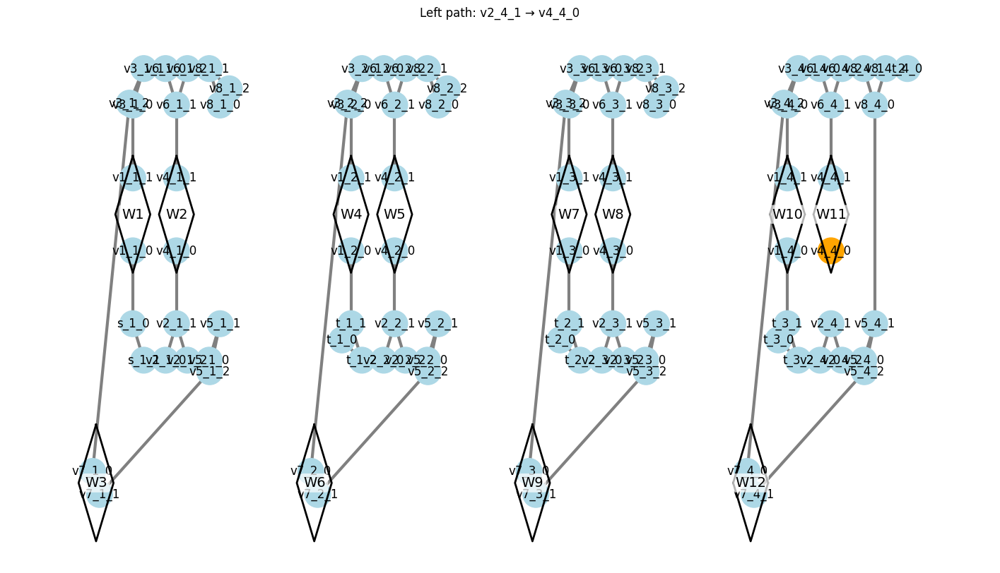

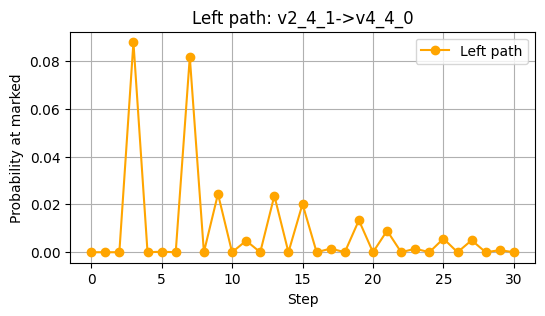


=== Step 15: Current clique v5_4 ===
  [RIGHT] Move to v8_4, burn edge v5_4-v8_4
Removed edge between v5_4_1 and v8_4_0
|alpha> vectors for red are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (red) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for blue are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (blue) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for green are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (green) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for orange are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (orange) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for brown are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (brown) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for cyan are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (cyan) is unitary (within tolerance). 4.44089

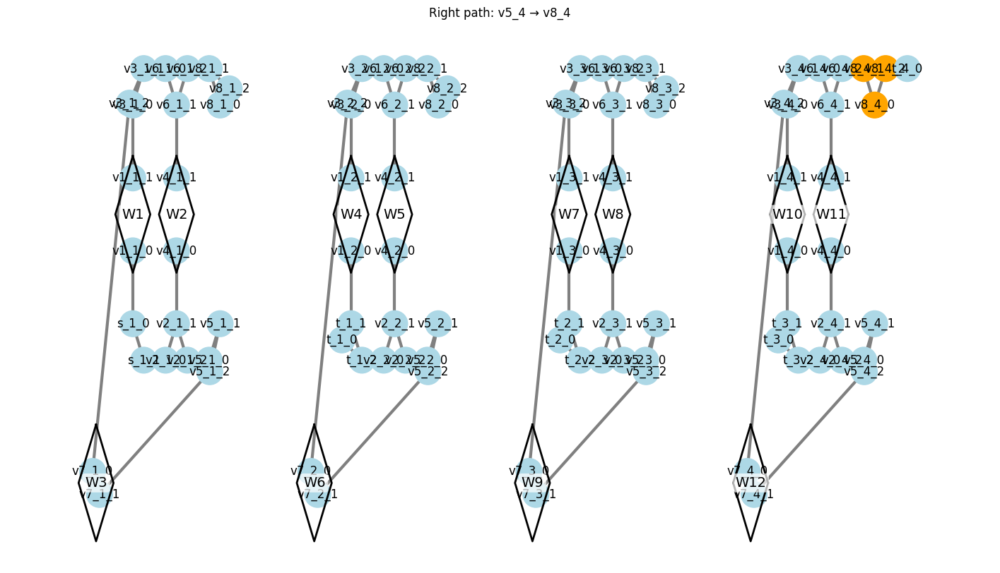

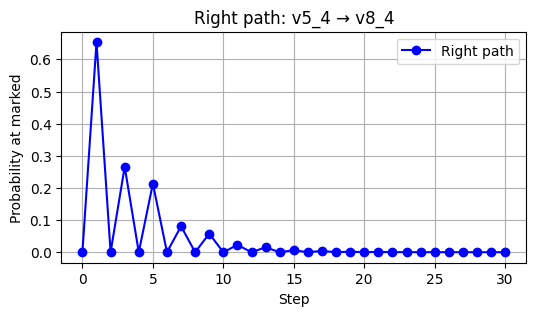

  [LEFT] Move from v5_4_2 to welded neighbor v7_4_1, burn edge v5_4_2-v7_4_1
|alpha> vectors for red are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (red) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for blue are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (blue) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for green are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (green) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for orange are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (orange) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for brown are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (brown) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for cyan are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (cyan) is unitary (within tolerance). 4.440892098500626e-16
Operator composition order (f

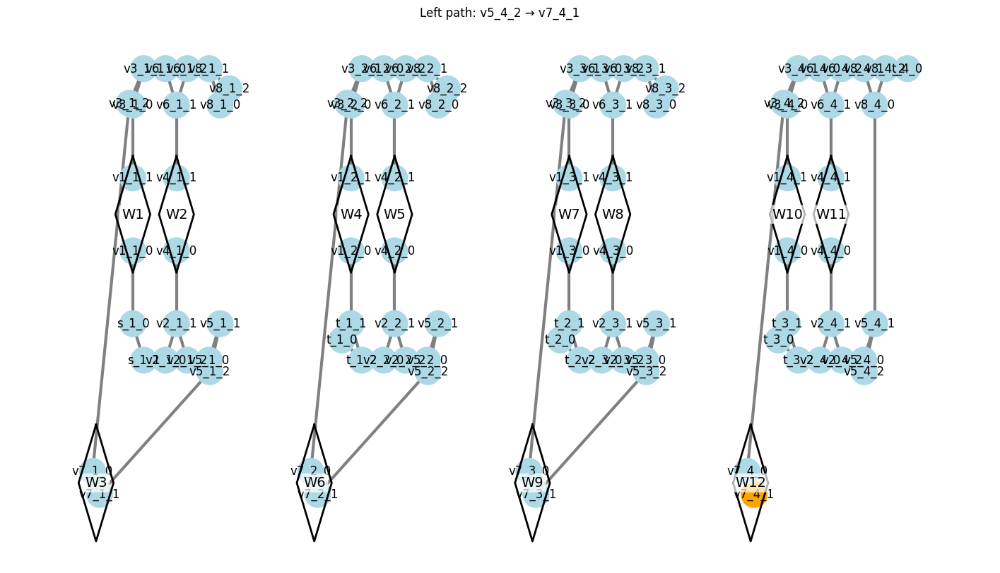

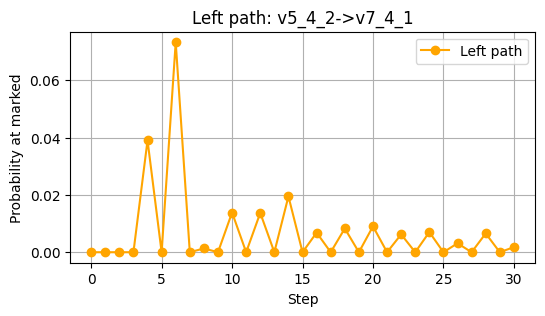


=== Step 16: Current clique v8_4 ===
  [RIGHT] Move to t_4, burn edge v8_4-t_4
Removed edge between v8_4_2 and t_4_0
build_R: operator (red) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for blue are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (blue) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for green are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (green) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for orange are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (orange) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for brown are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (brown) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for cyan are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (cyan) is unitary (within tolerance). 4.440892098500626e-16
Operator composition order (from right to left):
  [marke

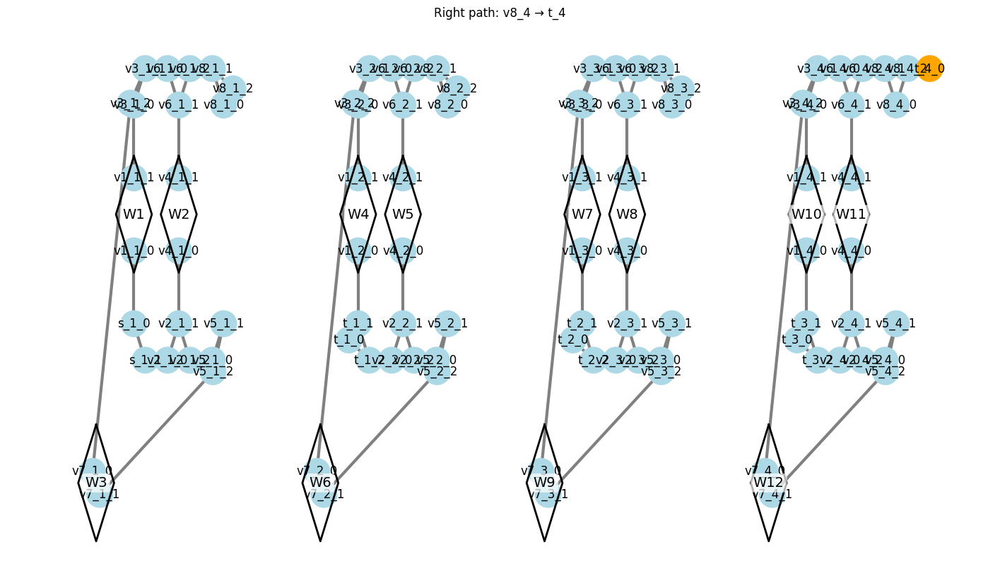

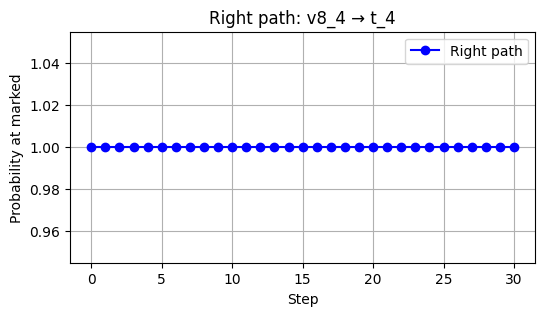

  [LEFT] Try v6 clique: v6_4
|alpha> vectors for red are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (red) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for blue are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (blue) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for green are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (green) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for orange are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (orange) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for brown are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (brown) is unitary (within tolerance). 4.440892098500626e-16
|alpha> vectors for cyan are orthonormal (max off-diagonal: 2.22e-16)
build_R: operator (cyan) is unitary (within tolerance). 4.440892098500626e-16
Operator composition order (from right to left):
  [marked] * red * blue * gr

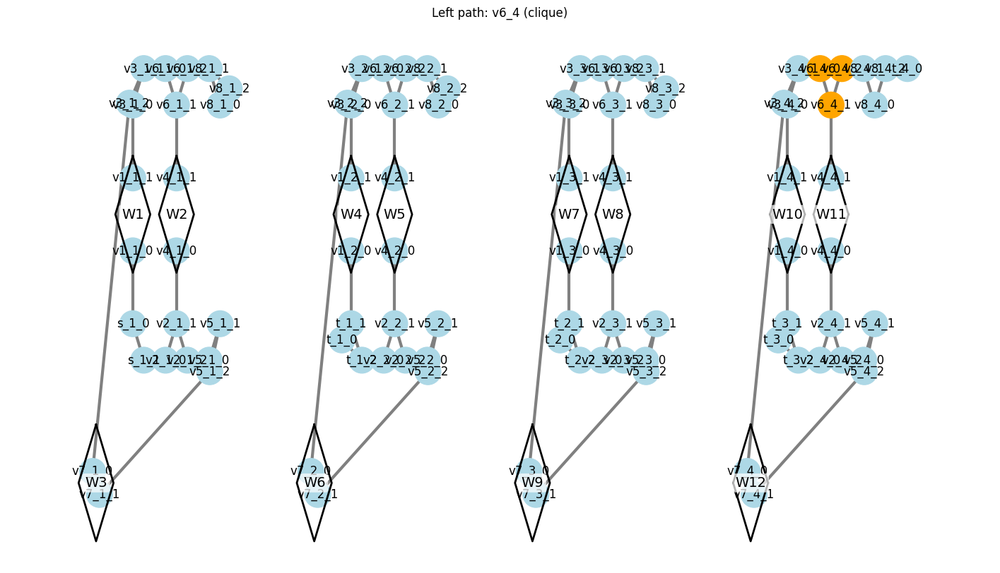

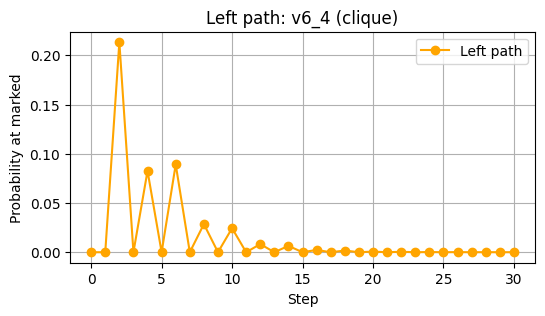

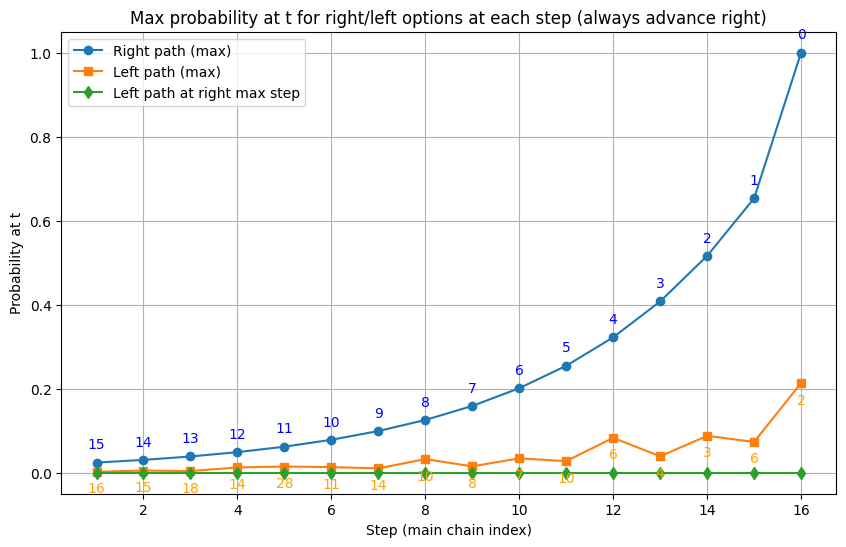

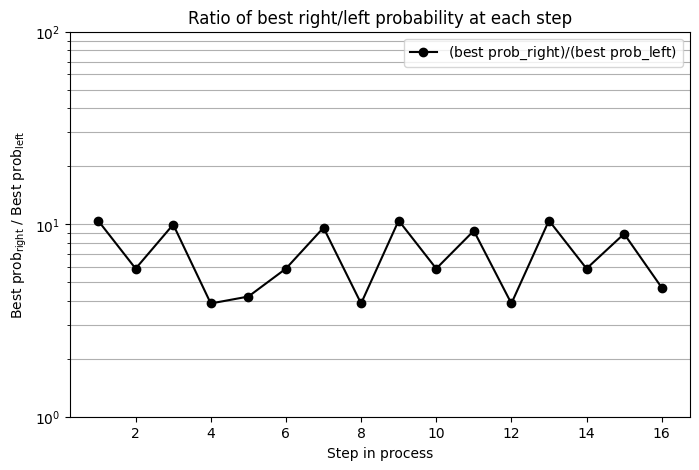


Step | Right Path (next) | Max Prob (Right) | Left Path (welded/v6) | Max Prob (Left) | Left@RightMax
-----|-------------------|------------------|-----------------------|-----------------|--------------
   1 |              v2_1 |           0.0241 |         s_1_0->v1_1_0 |          0.0023 |       0.0000
   2 |              v5_1 |           0.0306 |        v2_1_1->v4_1_0 |          0.0052 |       0.0000
   3 |              v8_1 |           0.0387 |        v5_1_2->v7_1_1 |          0.0039 |       0.0000
   4 |               t_1 |           0.0490 |         v6_1 (clique) |          0.0126 |       0.0000
   5 |              v2_2 |           0.0620 |         t_1_1->v1_2_0 |          0.0147 |       0.0000
   6 |              v5_2 |           0.0784 |        v2_2_1->v4_2_0 |          0.0133 |       0.0000
   7 |              v8_2 |           0.0992 |        v5_2_2->v7_2_1 |          0.0103 |       0.0000
   8 |               t_2 |           0.1256 |         v6_2 (clique) |          0.0324 | 

In [25]:
# --- Quantum walk: burn edges as you move, always mark t, plot and print at each step (LEFT and RIGHT at every node) ---

import numpy as np
import matplotlib.pyplot as plt

def plot_progress(H, pos, pairs, welded_nodes, initial_nodes, title):
    plt.figure(figsize=(18, 10))
    welded_set = set(welded_nodes)
    outside_nodes = [n for n in H.nodes() if n not in welded_set]
    node_colors = []
    for n in outside_nodes:
        if n in initial_nodes:
            node_colors.append('orange')
        else:
            node_colors.append('lightblue')
    nx.draw_networkx_nodes(H, pos, nodelist=outside_nodes, node_color=node_colors, node_size=700)
    outside_edges = [e for e in H.edges() if e[0] in outside_nodes and e[1] in outside_nodes]
    nx.draw_networkx_edges(H, pos, edgelist=outside_edges, edge_color='gray', width=3)
    nx.draw_networkx_labels(H, pos, labels={n: n for n in outside_nodes})
    for idx, (vj_0, vj_1) in enumerate(pairs):
        if vj_0 in pos and vj_1 in pos:
            x0, y0 = pos[vj_1]
            x1, y1 = pos[vj_0]
            center_x = (x0 + x1) / 2
            center_y = (y0 + y1) / 2
            size = 0.4
            diamond = [
                (center_x, center_y + size),
                (center_x + size, center_y),
                (center_x, center_y - size),
                (center_x - size, center_y),
                (center_x, center_y + size)
            ]
            xs, ys = zip(*diamond)
            plt.plot(xs, ys, color='black', linewidth=2)
            plt.text(center_x, center_y, f"W{idx+1}", fontsize=14, ha='center', va='center', color='black',
                     bbox=dict(facecolor='white', edgecolor='none', alpha=0.7, boxstyle='round,pad=0.2'))
    plt.title(title)
    plt.axis('off')
    plt.show()

# --- Setup ---
theta = np.pi / 2
max_steps = 30
right_results = []
left_results = []
left_at_right_max = []
right_steps = []
left_steps = []
right_path_names = []
left_path_names = []

chain_order = ['s_1']
n = 4
for i in range(1, n+1):
    chain_order.extend([f'v2_{i}', f'v5_{i}', f'v8_{i}', f't_{i}'])
# Do NOT slice off the last element

current = 's_1'

H_current = H_chain_welded.copy()
clique_tess_current = list(clique_tessellations)
edge_tess_current = list(edge_tessellations)
mapping = mapping_chain
pairs = pairs
pos = pos_H_chain_welded
marked_nodes = mapping['t_4']

for i in range(len(chain_order) - 1):
    print(f"\n=== Step {i+1}: Current clique {current} ===")
    next_right = chain_order[i+1]

    # --- 1. RIGHT PATH: test right (main chain), then update current node and graph ---
    print(f"  [RIGHT] Move to {next_right}, burn edge {current}-{next_right}")
    H_right, clique_tess_right, edge_tess_right = erase_edge_between_cliques_and_update_tessellations(
        H_current, mapping, current, next_right, clique_tess_current, edge_tess_current
    )
    welded_nodes_right = [n for n in H_right.nodes if "weld" in str(n)]
    edge_color_dict_right = assign_edge_colors(H_right, mapping, welded_nodes_right)
    green_edges = []
    orange_edges = []
    brown_edges = []
    cyan_edges = []
    for (u, v), color in edge_color_dict_right.items():
        if color == 'green':
            green_edges.append((u, v))
        elif color == 'orange':
            orange_edges.append((u, v))
        elif color == 'brown':
            brown_edges.append((u, v))
        elif color == 'cyan':
            cyan_edges.append((u, v))
    tessellations_right = {
        'red': clique_tess_right,
        'blue': edge_tess_right,
        'green': green_edges,
        'orange': orange_edges,
        'brown': brown_edges,
        'cyan': cyan_edges
    }
    node_list_right = list(H_right.nodes)
    weights_right = { (u, v): d.get('weight', 1) for u, v, d in H_right.edges(data=True) }
    W_right = compose_walk_operator_with_marked(
        H_right, node_list_right, tessellations_right, weights_right, welded_nodes_right, edge_color_dict_right, marked_nodes, theta=theta
    )
    next_right_clique = mapping[next_right]
    psi_0_right = np.zeros(len(node_list_right), dtype=np.complex128)
    for n in next_right_clique:
        if n in node_list_right:
            psi_0_right[node_list_right.index(n)] = 1
    psi_0_right /= np.linalg.norm(psi_0_right)
    end_indices_right = [node_list_right.index(n) for n in marked_nodes if n in node_list_right]
    probs_right = []
    state = psi_0_right.copy()
    for t in range(max_steps + 1):
        prob = np.sum(np.abs(state[end_indices_right])**2)
        probs_right.append(prob)
        norm = np.linalg.norm(state)
        if norm > 0:
            state = state / norm
        state = W_right @ state
    max_prob_right = np.max(probs_right)
    max_step_right = np.argmax(probs_right)
    right_results.append(max_prob_right)
    right_steps.append(max_step_right)
    right_path_names.append(next_right)
    print(f"    [RIGHT] Max prob at t: {max_prob_right:.4f} (step {max_step_right})")
    plot_progress(H_right, pos, pairs, welded_nodes_right, mapping[next_right], f"Right path: {current} → {next_right}")

    # --- Plot probability curve for right path ---
    plt.figure(figsize=(6, 3))
    plt.plot(range(max_steps + 1), probs_right, 'b-o', label='Right path')
    plt.xlabel('Step')
    plt.ylabel('Probability at marked')
    plt.title(f'Right path: {current} → {next_right}')
    plt.grid(True)
    plt.legend()
    plt.show()

    # --- 2. LEFT PATH: For each node in the current clique, check for welded neighbors (any node in a welded pair) ---
    left_found = False
    current_clique = mapping[current]
    probs_left = []
    left_label = ""
    max_prob_left = np.nan
    max_step_left = np.nan
    left_probs_for_plot = None

    for node in current_clique:
        for nbr in H_current.neighbors(node):
            for pair in pairs:
                if nbr in pair:
                    left_found = True
                    welded_neighbor = nbr
                    left_label = f"{node}->{welded_neighbor}"
                    print(f"  [LEFT] Move from {node} to welded neighbor {welded_neighbor}, burn edge {node}-{welded_neighbor}")
                    H_left = H_current.copy()
                    if H_left.has_edge(node, welded_neighbor):
                        H_left.remove_edge(node, welded_neighbor)
                    welded_nodes_left = [n for n in H_left.nodes if "weld" in str(n)]
                    edge_color_dict_left = assign_edge_colors(H_left, mapping, welded_nodes_left)
                    green_edges = []
                    orange_edges = []
                    brown_edges = []
                    cyan_edges = []
                    for (u, v), color in edge_color_dict_left.items():
                        if color == 'green':
                            green_edges.append((u, v))
                        elif color == 'orange':
                            orange_edges.append((u, v))
                        elif color == 'brown':
                            brown_edges.append((u, v))
                        elif color == 'cyan':
                            cyan_edges.append((u, v))
                    tessellations_left = {
                        'red': clique_tess_current,
                        'blue': edge_tess_current,
                        'green': green_edges,
                        'orange': orange_edges,
                        'brown': brown_edges,
                        'cyan': cyan_edges
                    }
                    node_list_left = list(H_left.nodes)
                    weights_left = { (u, v): d.get('weight', 1) for u, v, d in H_left.edges(data=True) }
                    W_left = compose_walk_operator_with_marked(
                        H_left, node_list_left, tessellations_left, weights_left, welded_nodes_left, edge_color_dict_left, marked_nodes, theta=theta
                    )
                    psi_0_left = np.zeros(len(node_list_left), dtype=np.complex128)
                    if welded_neighbor in node_list_left:
                        psi_0_left[node_list_left.index(welded_neighbor)] = 1.0
                    end_indices_left = [node_list_left.index(n) for n in marked_nodes if n in node_list_left]
                    probs_left = []
                    state = psi_0_left.copy()
                    for t in range(max_steps + 1):
                        prob = np.sum(np.abs(state[end_indices_left])**2)
                        probs_left.append(prob)
                        norm = np.linalg.norm(state)
                        if norm > 0:
                            state = state / norm
                        state = W_left @ state
                    max_prob_left = np.max(probs_left)
                    max_step_left = np.argmax(probs_left)
                    left_probs_for_plot = probs_left
                    left_at_right = probs_left[max_step_right] if max_step_right < len(probs_left) else np.nan
                    print(f"    [LEFT] Max prob at t: {max_prob_left:.4f} (step {max_step_left})")
                    print(f"    [LEFT] Prob at right's best step ({max_step_right}): {left_at_right:.4f}")
                    plot_progress(H_left, pos, pairs, welded_nodes_left, [welded_neighbor], f"Left path: {node} → {welded_neighbor}")

                    # --- Plot probability curve for left path ---
                    plt.figure(figsize=(6, 3))
                    plt.plot(range(max_steps + 1), probs_left, color='orange', marker='o', label='Left path')
                    plt.xlabel('Step')
                    plt.ylabel('Probability at marked')
                    plt.title(f'Left path: {left_label}')
                    plt.grid(True)
                    plt.legend()
                    plt.show()
                    break
            if left_found:
                break
        if left_found:
            break

    # If not found and current is v8_*, try v6_* clique as left path
    if not left_found and current.startswith("v8_"):
        block = current.split("_")[1]
        v6_name = f"v6_{block}"
        if v6_name in mapping:
            v6_clique = mapping[v6_name]
            left_label = f"{v6_name} (clique)"
            print(f"  [LEFT] Try v6 clique: {v6_name}")
            H_left = H_current.copy()
            welded_nodes_left = [n for n in H_left.nodes if "weld" in str(n)]
            edge_color_dict_left = assign_edge_colors(H_left, mapping, welded_nodes_left)
            green_edges = []
            orange_edges = []
            brown_edges = []
            cyan_edges = []
            for (u, v), color in edge_color_dict_left.items():
                if color == 'green':
                    green_edges.append((u, v))
                elif color == 'orange':
                    orange_edges.append((u, v))
                elif color == 'brown':
                    brown_edges.append((u, v))
                elif color == 'cyan':
                    cyan_edges.append((u, v))
            tessellations_left = {
                'red': clique_tess_current,
                'blue': edge_tess_current,
                'green': green_edges,
                'orange': orange_edges,
                'brown': brown_edges,
                'cyan': cyan_edges
            }
            node_list_left = list(H_left.nodes)
            weights_left = { (u, v): d.get('weight', 1) for u, v, d in H_left.edges(data=True) }
            W_left = compose_walk_operator_with_marked(
                H_left, node_list_left, tessellations_left, weights_left, welded_nodes_left, edge_color_dict_left, marked_nodes, theta=theta
            )
            psi_0_left = np.zeros(len(node_list_left), dtype=np.complex128)
            for n in v6_clique:
                if n in node_list_left:
                    psi_0_left[node_list_left.index(n)] = 1
            psi_0_left /= np.linalg.norm(psi_0_left)
            end_indices_left = [node_list_left.index(n) for n in marked_nodes if n in node_list_left]
            probs_left = []
            state = psi_0_left.copy()
            for t in range(max_steps + 1):
                prob = np.sum(np.abs(state[end_indices_left])**2)
                probs_left.append(prob)
                norm = np.linalg.norm(state)
                if norm > 0:
                    state = state / norm
                state = W_left @ state
            max_prob_left = np.max(probs_left)
            max_step_left = np.argmax(probs_left)
            left_probs_for_plot = probs_left
            left_at_right = probs_left[max_step_right] if max_step_right < len(probs_left) else np.nan
            print(f"    [LEFT] Max prob at t: {max_prob_left:.4f} (step {max_step_left})")
            print(f"    [LEFT] Prob at right's best step ({max_step_right}): {left_at_right:.4f}")
            plot_progress(H_left, pos, pairs, welded_nodes_left, v6_clique, f"Left path: v6_{block} (clique)")

            # --- Plot probability curve for left path ---
            plt.figure(figsize=(6, 3))
            plt.plot(range(max_steps + 1), probs_left, color='orange', marker='o', label='Left path')
            plt.xlabel('Step')
            plt.ylabel('Probability at marked')
            plt.title(f'Left path: {left_label}')
            plt.grid(True)
            plt.legend()
            plt.show()
            left_found = True

    # Store left results
    if left_found:
        left_results.append(max_prob_left)
        left_steps.append(max_step_left)
        left_path_names.append(left_label)
    else:
        left_results.append(np.nan)
        left_steps.append(np.nan)
        left_path_names.append("")
        left_probs_for_plot = [np.nan] * (max_steps + 1)
        left_at_right = np.nan
        print("  [LEFT] No welded neighbor or v6 clique from this clique.")
        print(f"    [LEFT] Prob at right's best step ({max_step_right}): nan")

    # Store left prob at right's best step
    left_at_right_max.append(left_at_right)

    # Update for next step
    H_current = H_right
    clique_tess_current = clique_tess_right
    edge_tess_current = edge_tess_right
    current = next_right

# --- Final summary plot ---
steps = np.arange(1, len(right_results)+1)
plt.figure(figsize=(10, 6))
plt.plot(steps, right_results, 'o-', label='Right path (max)')
plt.plot(steps, left_results, 's-', label='Left path (max)')
plt.plot(steps, left_at_right_max, 'd-', label='Left path at right max step')
for i, (p, s, name) in enumerate(zip(right_results, right_steps, right_path_names)):
    plt.annotate(f"{s}", (i+1, p), textcoords="offset points", xytext=(0,10), ha='center', color='blue')
for i, (p, s, name) in enumerate(zip(left_results, left_steps, left_path_names)):
    plt.annotate(f"{s}", (i+1, p), textcoords="offset points", xytext=(0,-15), ha='center', color='orange')
plt.xlabel("Step (main chain index)")
plt.ylabel("Probability at t")
plt.title("Max probability at t for right/left options at each step (always advance right)")
plt.legend()
plt.grid(True)
plt.show()

# --- Additional plot: ratio of best right/left probability at each step (logscale, custom ticks) ---

steps = np.arange(1, len(right_results)+1)
# Avoid division by zero: if left_results is zero, set ratio to np.nan (or a large value if you prefer)
ratio = []
for l, r in zip(left_results, right_results):
    if l == 0 or np.isnan(l):
        ratio.append(np.nan)  # or use a large value like 1e3 if you want to show it on the plot
    else:
        ratio.append(r / l)
ratio = np.array(ratio)

plt.figure(figsize=(8, 5))
plt.plot(steps, ratio, 'ko-', label=r'$(\mathrm{best\ prob\_right})/(\mathrm{best\ prob\_left})$')
plt.xlabel("Step in process")
plt.ylabel(r'Best prob$_{\mathrm{right}}$ / Best prob$_{\mathrm{left}}$')
plt.title(r'Ratio of best right/left probability at each step')
plt.yscale('log')

# Set y-ticks to 10^0, 10^1, 10^2
plt.yticks([1e0, 1e1, 1e2], [r'$10^{0}$', r'$10^{1}$', r'$10^{2}$'])

plt.grid(True, which='both', axis='y')
plt.legend()
plt.show()

# --- Print a table for clarity ---
print("\nStep | Right Path (next) | Max Prob (Right) | Left Path (welded/v6) | Max Prob (Left) | Left@RightMax")
print("-----|-------------------|------------------|-----------------------|-----------------|--------------")
for i in range(len(right_results)):
    r_name = right_path_names[i] if i < len(right_path_names) else ""
    l_name = left_path_names[i] if i < len(left_path_names) else ""
    r_prob = right_results[i] if i < len(right_results) else ""
    l_prob = left_results[i] if i < len(left_results) else ""
    l_at_r = left_at_right_max[i] if i < len(left_at_right_max) else ""
    print(f"{i+1:>4} | {r_name:>17} | {r_prob:>16.4f} | {l_name:>21} | {l_prob:>15.4f} | {l_at_r:>12.4f}")